# Kalpitiya Deforestation Analysis — Improved Pipeline
### Landsat 8 & 9 · Surface Reflectance · 2016 to 2025

**Improvements over previous version:**
| Fix | Description |
|---|---|
| Complete cells | All helper functions fully defined (no truncations) |
| Honest RF accuracy | Cross-scene validation on 3 unseen dates |
| Land mask | Persistent NDWI mask excludes ocean / lagoon pixels |
| Seasonal adjustment | T1/T2 matched to same calendar month |
| Cloud filtering | High-cloud scenes excluded from trend regression |
| Vectorised ops | Transition matrix uses `np.bincount` instead of nested loops |
| Robust IO | Context managers + explicit encodings throughout |
| Selective warnings | Only suppresses known harmless rasterio/numpy messages |

**Six passes, in order:**

| Pass | What happens | Output |
|---|---|---|
| 1 | Cloud-mask + scale + save stacked TIFs | `out/stacked/` |
| 2 | Compute NDVI, NDWI, NDBI, NBR, EVI + build land mask | `out/ndvi/` etc., `out/stats/land_mask.tif` |
| 3 | Train Random Forest (cross-scene validation) | `out/models/` |
| 4 | Classify all scenes (land pixels only) | `out/classmaps/` |
| 5 | Change detection (seasonal-adjusted, land-masked) | `out/change/` |
| 6 | Trend analysis + forecast to 2030 (reliable scenes) | `out/stats/` |

Restart-safe: already-processed TIFs are detected and skipped automatically.



In [1]:
import subprocess, sys

def install_if_missing(pkg, imp=None):
    try:
        __import__(imp or pkg)
    except ImportError:
        print(f"Installing {pkg}...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", pkg, "-q"])

for pkg, imp in [
    ("rasterio",    "rasterio"),
    ("scikit-learn","sklearn"),
    ("seaborn",     "seaborn"),
    ("joblib",      "joblib"),
    ("scipy",       "scipy"),
]:
    install_if_missing(pkg, imp)

print("All packages ready.")



All packages ready.


In [2]:
import os, re, gc, json, time, warnings
from pathlib import Path
from datetime import datetime

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import matplotlib.dates as mdates
import seaborn as sns
import rasterio
from rasterio.enums import Resampling
from scipy import stats as scipy_stats
from scipy.signal import savgol_filter
import joblib

from sklearn.ensemble import RandomForestClassifier, GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression
from sklearn.metrics import (accuracy_score, classification_report,
                              confusion_matrix, r2_score, mean_squared_error,
                              cohen_kappa_score)

# Selective warning suppression — keep real errors visible
warnings.filterwarnings("ignore", category=UserWarning,  module="rasterio")
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", message=".*invalid value encountered.*")
warnings.filterwarnings("ignore", message=".*divide by zero.*")

plt.rcParams.update({
    "font.family":       "DejaVu Sans",
    "font.size":         11,
    "axes.titlesize":    13,
    "figure.dpi":        110,
    "figure.facecolor":  "white",
    "axes.facecolor":    "white",
    "axes.spines.right": False,
    "axes.spines.top":   False,
})

print("Imports complete.")



Imports complete.


In [3]:
# ── Only change these lines ───────────────────────────────────────────────────
RAW_DIR    = "data/raw"
OUT_DIR    = "out"
DOWNSAMPLE = 2          # 1=full res (~1.6 GB/scene), 2=half res, 4=quarter res

# Landsat Collection 2 Level-2 scaling: SR = DN * 0.0000275 + (−0.2)
SCALE  = 0.0000275
OFFSET = -0.2

# QA_PIXEL bit flags (Landsat C2 product guide)
QA_FILL       = 0x0001
QA_DILCLD     = 0x0002
QA_CIRRUS     = 0x0004
QA_CLOUD      = 0x0008
QA_SHADOW     = 0x0010
QA_CLOUD_MASK = QA_FILL | QA_DILCLD | QA_CIRRUS | QA_CLOUD | QA_SHADOW

# Land cover classes
CLASS_NAMES  = {0: "Water", 1: "Vegetation", 2: "Bare Soil", 3: "Built-Up"}
CLASS_COLORS = {-1: "#cccccc", 0: "#2171b5", 1: "#238b45", 2: "#d4a843", 3: "#cb181d"}

VEG_THRESHOLD = 0.25

# Derived constants — do not edit
DOWNSAMPLE    = int(DOWNSAMPLE)
PX_HA         = (30 * DOWNSAMPLE) ** 2 / 10_000   # ha per pixel at chosen res
FEATURE_NAMES = ["B2","B3","B4","B5","B6","B7","NDVI","NDWI","NDBI","NBR","EVI"]

# Create output directories up front
for sub in ["stacked","ndvi","ndwi","ndbi","nbr","evi",
            "classmaps","change","graphs","stats","models"]:
    os.makedirs(os.path.join(OUT_DIR, sub), exist_ok=True)

print(f"RAW_DIR    : {os.path.abspath(RAW_DIR)}")
print(f"OUT_DIR    : {os.path.abspath(OUT_DIR)}")
print(f"DOWNSAMPLE : {DOWNSAMPLE}x  =>  ~{7761//DOWNSAMPLE} x {7611//DOWNSAMPLE} px")
print(f"PX_HA      : {PX_HA:.4f} ha/pixel  ({30*DOWNSAMPLE}m resolution)")



RAW_DIR    : d:\Projects\GitHub\terraShiftSriLanka\data\raw
OUT_DIR    : d:\Projects\GitHub\terraShiftSriLanka\out
DOWNSAMPLE : 2x  =>  ~3880 x 3805 px
PX_HA      : 0.3600 ha/pixel  (60m resolution)


In [4]:

# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
# Helper functions — all defined here so every downstream cell can import them
# without worrying about execution order on kernel restart.
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

def parse_landsat_name(fname):
    """Parse a Landsat Collection 2 filename into a metadata dict."""
    base = os.path.basename(fname)
    m = re.match(
        r"(LC0[89])_L2SP_(\d{6})_(\d{8})_\d{8}_\d{2}_T\d_"
        r"(SR_B[1-7]|QA_PIXEL|QA_RADSAT|SR_QA_AEROSOL)",
        base, re.IGNORECASE
    )
    if not m:
        return None
    acq = m.group(3)
    return {
        "sensor":   m.group(1).upper(),
        "path_row": m.group(2),
        "date":     datetime.strptime(acq, "%Y%m%d"),
        "band":     m.group(4).upper(),
        "label":    f"{acq[:4]}_{acq[4:6]}",
    }


def discover_scenes(raw_dir):
    """Build a catalogue of Landsat band file-paths from a directory tree."""
    raw_path = Path(raw_dir)
    if not raw_path.exists():
        raise FileNotFoundError(f"Raw data directory not found: {raw_dir}")
    scenes = {}
    for folder in sorted(raw_path.iterdir()):
        if not folder.is_dir():
            continue
        tifs = sorted(list(folder.glob("*.TIF")) + list(folder.glob("*.tif")))
        if not tifs:
            print(f"  {folder.name}: no TIF files — skipping")
            continue
        entry = {}
        first_info = None
        for tif in tifs:
            info = parse_landsat_name(tif.name)
            if info:
                entry[info["band"]] = str(tif)
                if first_info is None:
                    first_info = info
        if not entry or first_info is None:
            print(f"  {folder.name}: no Landsat-named TIFs — skipping")
            continue
        entry["_meta"] = {
            "sensor":   first_info["sensor"],
            "date":     first_info["date"],
            "label":    first_info["label"],
            "path_row": first_info["path_row"],
        }
        scenes[first_info["label"]] = entry
    return scenes


def load_band(path, downsample=1):
    """Load one SR band, scale to surface reflectance, return (array, profile)."""
    with rasterio.open(path) as src:
        if downsample == 1:
            arr     = src.read(1).astype(np.float32)
            profile = src.profile.copy()
        else:
            out_h = src.height // downsample
            out_w = src.width  // downsample
            arr   = src.read(
                1, out_shape=(out_h, out_w),
                resampling=Resampling.bilinear
            ).astype(np.float32)
            new_t   = src.transform * src.transform.scale(
                src.width / out_w, src.height / out_h
            )
            profile = src.profile.copy()
            profile.update(height=out_h, width=out_w, transform=new_t)
        nodata = src.nodata
    if nodata is not None:
        arr[arr == nodata] = np.nan
    arr = np.clip(arr * SCALE + OFFSET, 0.0, 1.0)
    return arr, profile


def load_qa(path, downsample=1):
    """Load QA_PIXEL band, return boolean mask — True = bad pixel.
    Uses nearest-neighbour resampling so bit flags are never interpolated."""
    with rasterio.open(path) as src:
        if downsample == 1:
            qa = src.read(1).astype(np.uint16)
        else:
            out_h = src.height // downsample
            out_w = src.width  // downsample
            qa = src.read(
                1, out_shape=(out_h, out_w),
                resampling=Resampling.nearest
            ).astype(np.uint16)
    return (qa & QA_CLOUD_MASK) != 0


def save_raster(arr, profile, out_path):
    """Write a 2-D float32 array as a single-band LZW-compressed GeoTIFF."""
    os.makedirs(os.path.dirname(os.path.abspath(out_path)), exist_ok=True)
    p = profile.copy()
    p.update(count=1, dtype="float32", compress="lzw",
             nodata=float("nan"), BIGTIFF="YES")
    with rasterio.open(out_path, "w", **p) as dst:
        dst.write(arr[np.newaxis, :, :])


def pct_stretch(band, pct_lo=2, pct_hi=98):
    """Percentile contrast stretch for RGB visualisation; returns float32 [0,1]."""
    valid = band[~np.isnan(band)]
    if len(valid) == 0:
        return np.zeros_like(band, dtype=np.float32)
    lo, hi = np.percentile(valid, [pct_lo, pct_hi])
    if hi == lo:
        return np.zeros_like(band, dtype=np.float32)
    return np.clip((band - lo) / (hi - lo), 0.0, 1.0).astype(np.float32)


def read_index_tif(label, index_name):
    """Load a pre-computed single-band spectral index TIF."""
    path = f"{OUT_DIR}/{index_name}/{label}_{index_name}.tif"
    with rasterio.open(path) as src:
        return src.read(1).astype(np.float32)


def safe_ratio(a, b):
    """Normalised difference (a-b)/(a+b) with NaN where denominator ~ 0."""
    a = a.astype(np.float32)
    b = b.astype(np.float32)
    with np.errstate(invalid="ignore", divide="ignore"):
        denom  = a + b
        result = np.where(np.abs(denom) > 1e-9, (a - b) / denom, np.nan)
    return result.astype(np.float32)


def compute_indices(stack):
    """
    Compute spectral indices from a 7-band Landsat stack.

    Band order (0-based):
      0=B1  1=B2(Blue)  2=B3(Green)  3=B4(Red)
      4=B5(NIR)  5=B6(SWIR1)  6=B7(SWIR2)

    Returns dict: ndvi, ndwi, ndbi, nbr, evi
    """
    blue  = stack[1];  green = stack[2];  red   = stack[3]
    nir   = stack[4];  swir1 = stack[5];  swir2 = stack[6]

    ndvi = np.clip(safe_ratio(nir,   red),   -1.0, 1.0)
    ndwi = np.clip(safe_ratio(green, nir),   -1.0, 1.0)
    ndbi = np.clip(safe_ratio(swir1, nir),   -1.0, 1.0)
    nbr  = np.clip(safe_ratio(nir,   swir2), -1.0, 1.0)

    # EVI = 2.5 * (NIR - Red) / (NIR + 6*Red - 7.5*Blue + 1)
    with np.errstate(invalid="ignore", divide="ignore"):
        d_evi = (nir.astype(np.float32)
                 + 6.0  * red.astype(np.float32)
                 - 7.5  * blue.astype(np.float32)
                 + 1.0)
        evi = np.where(
            np.abs(d_evi) > 1e-9,
            2.5 * (nir.astype(np.float32) - red.astype(np.float32)) / d_evi,
            np.nan
        )
    evi = np.clip(evi, -1.0, 1.0).astype(np.float32)

    return {"ndvi": ndvi, "ndwi": ndwi, "ndbi": ndbi, "nbr": nbr, "evi": evi}


def pseudo_labels(ndvi_f, ndwi_f, ndbi_f):
    """
    Rule-based pseudo-label generator.
    Only confident pixels are labelled; ambiguous ones stay -1.

    Classes:  0=Water  1=Vegetation  2=Bare Soil  3=Built-Up/Scrub
    """
    lab = np.full(len(ndvi_f), -1, dtype=np.int8)
    lab[(ndvi_f > 0.05)  & (ndvi_f < 0.22) & (np.abs(ndbi_f) < 0.12)] = 2
    lab[(ndbi_f > 0.08)  & (ndvi_f < 0.12)]                             = 3
    lab[(ndwi_f > 0.15)  & (ndvi_f < 0.02)]                             = 0
    lab[(ndvi_f > 0.32)  & (ndwi_f < -0.05)]                            = 1
    return lab


def build_feature_matrix(stack, ndvi, ndwi, ndbi, nbr, evi):
    """
    Stack bands + indices into (N_valid_pixels, 11) feature matrix.
    Returns (X, valid_mask) where valid_mask is bool (H, W).
    """
    layers = [
        stack[1], stack[2], stack[3],      # B2 B3 B4
        stack[4], stack[5], stack[6],      # B5 B6 B7
        ndvi, ndwi, ndbi, nbr, evi,
    ]
    cube       = np.stack(layers, axis=0)        # (11, H, W)
    valid_mask = ~np.any(np.isnan(cube), axis=0) # (H, W)  True = usable
    X          = cube[:, valid_mask].T           # (N_valid, 11)
    return X, valid_mask


def veg_change_stats(ndvi_t1, ndvi_t2, land_mask=None, thresh=VEG_THRESHOLD):
    """
    Vegetation cover comparison between two NDVI images.
    If land_mask (bool, True=land) is supplied, ocean/lagoon pixels are excluded.
    """
    h = min(ndvi_t1.shape[0], ndvi_t2.shape[0])
    w = min(ndvi_t1.shape[1], ndvi_t2.shape[1])
    t1, t2 = ndvi_t1[:h, :w], ndvi_t2[:h, :w]
    both_valid = (~np.isnan(t1)) & (~np.isnan(t2))
    if land_mask is not None:
        both_valid = both_valid & land_mask[:h, :w]
    v1 = (t1 > thresh) & both_valid
    v2 = (t2 > thresh) & both_valid
    n1, n2 = int(v1.sum()), int(v2.sum())
    lost   = int((v1 & ~v2).sum())
    gained = int((~v1 & v2).sum())
    return {
        "n_veg_t1":  n1,   "n_veg_t2":  n2,
        "lost_px":   lost, "gained_px": gained,
        "lost_ha":   round(lost        * PX_HA, 1),
        "gained_ha": round(gained      * PX_HA, 1),
        "net_ha":    round((n2 - n1)   * PX_HA, 1),
        "pct_loss":  round(100 * lost   / n1 if n1 > 0 else 0.0, 2),
        "pct_gain":  round(100 * gained / n1 if n1 > 0 else 0.0, 2),
        "pct_net":   round(100 * (n2 - n1) / n1 if n1 > 0 else 0.0, 2),
    }


print("All helper functions defined.")



All helper functions defined.


In [5]:
SCENES = discover_scenes(RAW_DIR)
LABELS = sorted(SCENES.keys())

if not LABELS:
    raise RuntimeError(
        f"No valid Landsat scenes found in {RAW_DIR!r}.\n"
        "Check that sub-folders contain LC08/LC09 TIF files."
    )

print(f"Found {len(LABELS)} scenes: {LABELS[0]} to {LABELS[-1]}\n")
for lbl in LABELS:
    meta = SCENES[lbl].get("_meta", {})
    sr   = sum(1 for k in SCENES[lbl] if k.startswith("SR_B"))
    qa   = "yes" if "QA_PIXEL" in SCENES[lbl] else "NO"
    date = meta["date"].strftime("%Y-%m-%d") if "date" in meta else "?"
    print(f"  {lbl}  {meta.get('sensor','?')}  {date}  SR_bands={sr}  QA={qa}")



Found 20 scenes: 2016_02 to 2025_03

  2016_02  LC08  2016-02-03  SR_bands=7  QA=yes
  2016_03  LC08  2016-03-06  SR_bands=7  QA=yes
  2017_02  LC08  2017-02-05  SR_bands=7  QA=yes
  2017_03  LC08  2017-03-25  SR_bands=7  QA=yes
  2018_02  LC08  2018-02-08  SR_bands=7  QA=yes
  2018_03  LC08  2018-03-28  SR_bands=7  QA=yes
  2019_02  LC08  2019-02-11  SR_bands=7  QA=yes
  2019_03  LC08  2019-03-15  SR_bands=7  QA=yes
  2020_02  LC08  2020-02-14  SR_bands=7  QA=yes
  2020_03  LC08  2020-03-01  SR_bands=7  QA=yes
  2021_02  LC08  2021-02-16  SR_bands=7  QA=yes
  2021_03  LC08  2021-03-04  SR_bands=7  QA=yes
  2022_02  LC09  2022-02-27  SR_bands=7  QA=yes
  2022_03  LC08  2022-03-23  SR_bands=7  QA=yes
  2023_02  LC09  2023-02-14  SR_bands=7  QA=yes
  2023_03  LC09  2023-03-18  SR_bands=7  QA=yes
  2024_02  LC09  2024-02-17  SR_bands=7  QA=yes
  2024_03  LC09  2024-03-04  SR_bands=7  QA=yes
  2025_02  LC09  2025-02-03  SR_bands=7  QA=yes
  2025_03  LC09  2025-03-07  SR_bands=7  QA=yes


  Label Sensor       Date  SR Bands Has QA
2016_02   LC08 2016-02-03         7    yes
2016_03   LC08 2016-03-06         7    yes
2017_02   LC08 2017-02-05         7    yes
2017_03   LC08 2017-03-25         7    yes
2018_02   LC08 2018-02-08         7    yes
2018_03   LC08 2018-03-28         7    yes
2019_02   LC08 2019-02-11         7    yes
2019_03   LC08 2019-03-15         7    yes
2020_02   LC08 2020-02-14         7    yes
2020_03   LC08 2020-03-01         7    yes
2021_02   LC08 2021-02-16         7    yes
2021_03   LC08 2021-03-04         7    yes
2022_02   LC09 2022-02-27         7    yes
2022_03   LC08 2022-03-23         7    yes
2023_02   LC09 2023-02-14         7    yes
2023_03   LC09 2023-03-18         7    yes
2024_02   LC09 2024-02-17         7    yes
2024_03   LC09 2024-03-04         7    yes
2025_02   LC09 2025-02-03         7    yes
2025_03   LC09 2025-03-07         7    yes


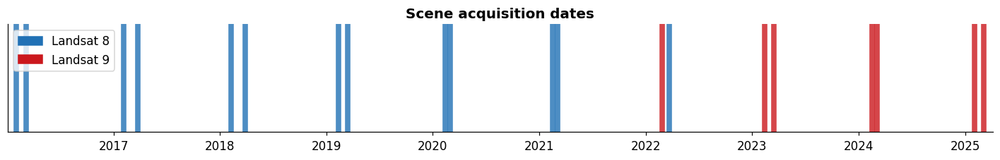

In [6]:
rows = []
for lbl in LABELS:
    meta = SCENES[lbl].get("_meta", {})
    rows.append({
        "Label":    lbl,
        "Sensor":   meta.get("sensor", "?"),
        "Date":     meta["date"].strftime("%Y-%m-%d") if "date" in meta else "?",
        "SR Bands": sum(1 for k in SCENES[lbl] if k.startswith("SR_B")),
        "Has QA":   "yes" if "QA_PIXEL" in SCENES[lbl] else "NO",
    })
df_inv = pd.DataFrame(rows)
print(df_inv.to_string(index=False))

# Timeline plot
fig, ax = plt.subplots(figsize=(13, 2.2))
sensor_colors = {"LC08": "#2171b5", "LC09": "#cb181d"}
for _, r in df_inv.iterrows():
    c = sensor_colors.get(r["Sensor"], "gray")
    try:
        dt_num = mdates.date2num(datetime.strptime(r["Date"], "%Y-%m-%d"))
        ax.axvline(dt_num, color=c, lw=5, alpha=0.8)
    except Exception:
        pass
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.legend(handles=[
    mpatches.Patch(color="#2171b5", label="Landsat 8"),
    mpatches.Patch(color="#cb181d", label="Landsat 9"),
], loc="upper left")
ax.set_title("Scene acquisition dates", fontweight="bold")
ax.yaxis.set_visible(False)
try:
    all_dates = [datetime.strptime(r["Date"], "%Y-%m-%d")
                 for _, r in df_inv.iterrows() if r["Date"] != "?"]
    if all_dates:
        ax.set_xlim(mdates.date2num(min(all_dates)) - 30,
                    mdates.date2num(max(all_dates)) + 30)
except Exception:
    pass
plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/01_timeline.png", dpi=130, bbox_inches="tight")
plt.show()



In [7]:
# Pass 1 — cloud-mask, scale, save stacked TIF for every scene.
# One scene in RAM at a time; after save we del + gc.collect().
# Already-done scenes are skipped automatically.

print(f"Pass 1 — Preprocessing  (DOWNSAMPLE={DOWNSAMPLE}) ...\n")
cloud_log = {}

for label in LABELS:
    out_path  = f"{OUT_DIR}/stacked/{label}_stack.tif"
    side_path = f"{OUT_DIR}/stacked/{label}_cloud.txt"

    if os.path.exists(out_path):
        try:
            with open(side_path, "r", encoding="utf-8") as fh:
                cloud_log[label] = float(fh.read().strip())
        except (FileNotFoundError, ValueError):
            cloud_log[label] = 0.0
        print(f"  {label}  already done  (cloud={cloud_log[label]:.1f}%)")
        continue

    t0    = time.time()
    scene = SCENES[label]
    bands, profile = [], None

    for i in range(1, 8):
        bk = f"SR_B{i}"
        if bk not in scene:
            print(f"  {label}  WARNING: {bk} missing — scene skipped")
            bands = []
            break
        arr, prof = load_band(scene[bk], downsample=DOWNSAMPLE)
        bands.append(arr)
        del arr
        if profile is None:
            profile = prof

    if not bands:
        continue

    stack = np.stack(bands, axis=0).astype(np.float32)   # (7, H, W)
    del bands
    gc.collect()

    # Cloud mask
    if "QA_PIXEL" in scene:
        bad = load_qa(scene["QA_PIXEL"], downsample=DOWNSAMPLE)
        cloud_pct = 100.0 * bad.sum() / bad.size
        stack[:, bad] = np.nan
        del bad
    else:
        cloud_pct = 0.0
        print(f"  {label}  WARNING: no QA_PIXEL — cloud masking skipped")

    cloud_log[label] = round(cloud_pct, 2)

    # Save stacked TIF
    p = profile.copy()
    p.update(count=7, dtype="float32", compress="lzw",
             nodata=float("nan"), BIGTIFF="YES")
    with rasterio.open(out_path, "w", **p) as dst:
        dst.write(stack)
    del stack
    gc.collect()

    with open(side_path, "w", encoding="utf-8") as fh:
        fh.write(str(cloud_log[label]))

    print(f"  {label}  done  ({time.time()-t0:.0f}s  cloud={cloud_pct:.1f}%)")

print("\nPass 1 complete.")



Pass 1 — Preprocessing  (DOWNSAMPLE=2) ...

  2016_02  already done  (cloud=41.1%)
  2016_03  already done  (cloud=47.6%)
  2017_02  already done  (cloud=38.4%)
  2017_03  already done  (cloud=40.8%)
  2018_02  already done  (cloud=56.4%)
  2018_03  already done  (cloud=49.7%)
  2019_02  already done  (cloud=48.2%)
  2019_03  already done  (cloud=48.3%)
  2020_02  already done  (cloud=42.4%)
  2020_03  already done  (cloud=40.1%)
  2021_02  already done  (cloud=53.4%)
  2021_03  already done  (cloud=41.7%)
  2022_02  already done  (cloud=41.8%)
  2022_03  already done  (cloud=55.8%)
  2023_02  already done  (cloud=46.7%)
  2023_03  already done  (cloud=55.0%)
  2024_02  already done  (cloud=60.7%)
  2024_03  already done  (cloud=43.7%)
  2025_02  already done  (cloud=48.4%)
  2025_03  already done  (cloud=40.1%)

Pass 1 complete.


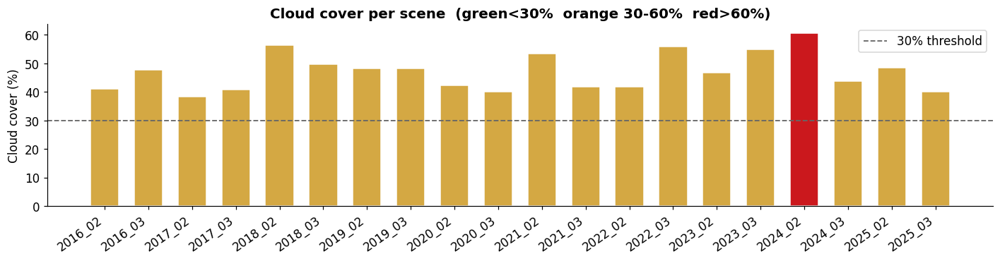

In [8]:
fig, ax = plt.subplots(figsize=(13, 3.5))
labels_plot = list(cloud_log.keys())
values_plot = list(cloud_log.values())
bar_colors  = ["#238b45" if v < 30 else "#d4a843" if v < 60 else "#cb181d"
               for v in values_plot]

ax.bar(labels_plot, values_plot, color=bar_colors, edgecolor="white", width=0.65)
ax.axhline(30, color="#666", ls="--", lw=1.2, label="30% threshold")
ax.set_ylabel("Cloud cover (%)")
ax.set_title("Cloud cover per scene  (green<30%  orange 30-60%  red>60%)",
             fontweight="bold")
ax.legend()
plt.xticks(rotation=35, ha="right")
plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/02_cloud_cover.png", dpi=130, bbox_inches="tight")
plt.show()



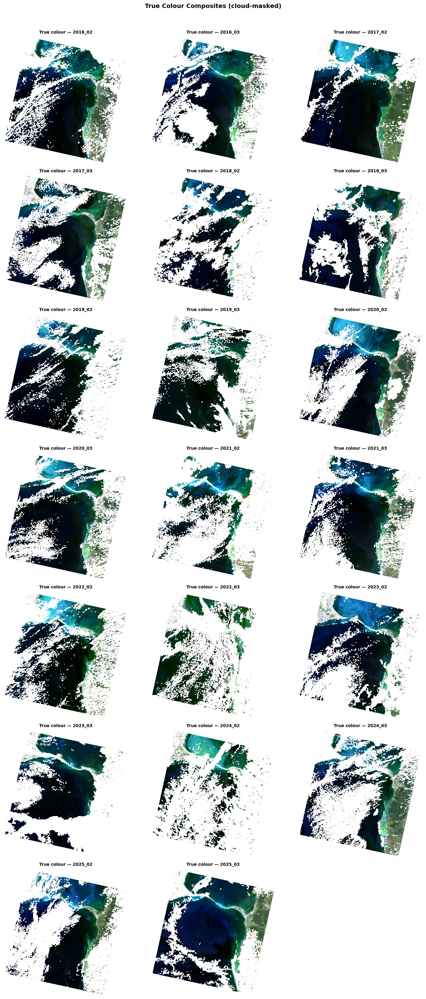

In [9]:
ncols = 3
nrows = (len(LABELS) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4.5, nrows * 4.2))
axes = np.array(axes).ravel()

for i, label in enumerate(LABELS):
    stk_path = f"{OUT_DIR}/stacked/{label}_stack.tif"
    if not os.path.exists(stk_path):
        axes[i].set_title(f"{label} — missing"); axes[i].axis("off"); continue

    with rasterio.open(stk_path) as src:
        r = src.read(4).astype(np.float32)
        g = src.read(3).astype(np.float32)
        b = src.read(2).astype(np.float32)

    rgb = np.stack([pct_stretch(r), pct_stretch(g), pct_stretch(b)], axis=-1)
    del r, g, b; gc.collect()
    axes[i].imshow(rgb)
    axes[i].set_title(f"True colour — {label}", fontsize=9, fontweight="bold")
    axes[i].axis("off")
    del rgb; gc.collect()

for j in range(len(LABELS), len(axes)):
    axes[j].set_visible(False)

plt.suptitle("True Colour Composites (cloud-masked)", fontsize=13,
             fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/02_rgb_grid.png", dpi=100, bbox_inches="tight")
plt.show()



In [10]:
# Pass 2 — compute spectral indices, save per-scene TIFs, collect stats.

print("Pass 2 — Spectral indices ...\n")
stats_rows = []

for label in LABELS:
    stk_path = f"{OUT_DIR}/stacked/{label}_stack.tif"
    if not os.path.exists(stk_path):
        print(f"  {label}: stacked TIF missing — run Pass 1 first"); continue

    t0 = time.time()
    with rasterio.open(stk_path) as src:
        stack   = src.read().astype(np.float32)
        profile = src.profile.copy()

    idx = compute_indices(stack)
    del stack; gc.collect()

    one_band = profile.copy()
    one_band.update(count=1, dtype="float32", compress="lzw",
                    nodata=float("nan"), BIGTIFF="YES")

    for iname, arr in idx.items():
        out_path = f"{OUT_DIR}/{iname}/{label}_{iname}.tif"
        if not os.path.exists(out_path):
            save_raster(arr, one_band, out_path)

    valid = idx["ndvi"][~np.isnan(idx["ndvi"])].ravel()
    meta  = SCENES[label].get("_meta", {})
    date  = meta.get("date", None)
    if len(valid) > 1000 and date is not None:
        stats_rows.append({
            "label":      label,
            "date":       date,
            "date_frac":  date.year + (date.timetuple().tm_yday - 1) / 365.0,
            "mean_ndvi":  float(np.nanmean(idx["ndvi"])),
            "std_ndvi":   float(np.nanstd(idx["ndvi"])),
            "median_ndvi":float(np.nanmedian(idx["ndvi"])),
            "p10":        float(np.nanpercentile(idx["ndvi"], 10)),
            "p90":        float(np.nanpercentile(idx["ndvi"], 90)),
            "pct_dense":   float(100 * (idx["ndvi"] > 0.50).sum() / np.isfinite(idx["ndvi"]).sum()),
            "pct_moderate":float(100 * ((idx["ndvi"] >= 0.25) & (idx["ndvi"] <= 0.50)).sum()
                                 / np.isfinite(idx["ndvi"]).sum()),
            "pct_nonveg":  float(100 * (idx["ndvi"] <= 0).sum() / np.isfinite(idx["ndvi"]).sum()),
            "n_valid_px":  int(np.isfinite(idx["ndvi"]).sum()),
        })

    del idx; gc.collect()
    print(f"  {label}  done  ({time.time()-t0:.0f}s)")

df_ts = pd.DataFrame(stats_rows).sort_values("date").reset_index(drop=True)
print(f"\nPass 2 complete. Time-series rows: {len(df_ts)}")



Pass 2 — Spectral indices ...

  2016_02  done  (6s)
  2016_03  done  (6s)
  2017_02  done  (6s)
  2017_03  done  (6s)
  2018_02  done  (6s)
  2018_03  done  (6s)
  2019_02  done  (6s)
  2019_03  done  (7s)
  2020_02  done  (5s)
  2020_03  done  (4s)
  2021_02  done  (4s)
  2021_03  done  (4s)
  2022_02  done  (4s)
  2022_03  done  (4s)
  2023_02  done  (4s)
  2023_03  done  (3s)
  2024_02  done  (4s)
  2024_03  done  (4s)
  2025_02  done  (4s)
  2025_03  done  (4s)

Pass 2 complete. Time-series rows: 20


Land mask loaded from disk  (7,194,661 land pixels)


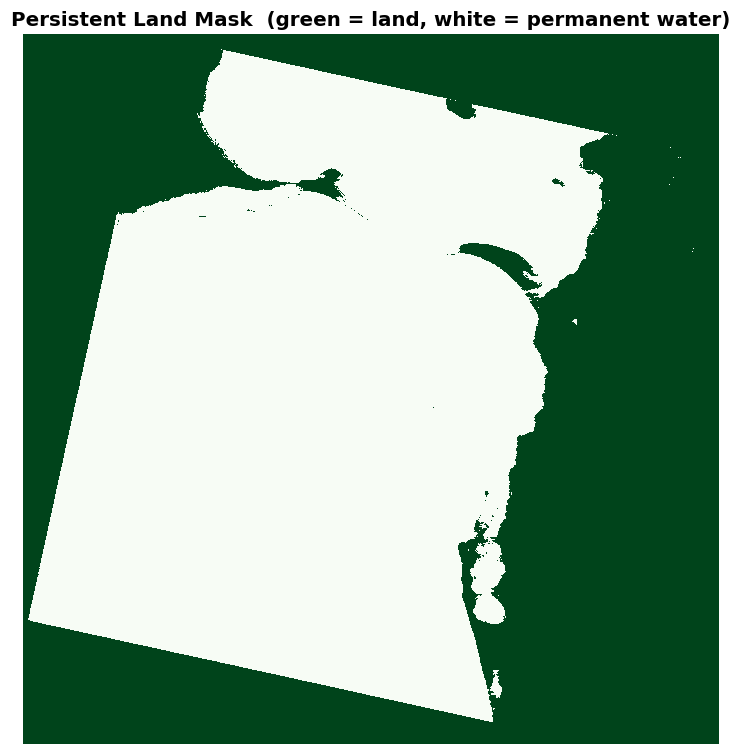

In [11]:
# Land mask — pixel is 'permanent water' if NDWI > 0.15 in > 60% of scenes.
# Built from all available NDWI TIFs. Saved to disk for restart safety.

land_mask_path = f"{OUT_DIR}/stats/land_mask.tif"

if os.path.exists(land_mask_path):
    with rasterio.open(land_mask_path) as src:
        LAND_MASK  = src.read(1).astype(bool)
        mask_prof  = src.profile.copy()
    print(f"Land mask loaded from disk  ({LAND_MASK.sum():,} land pixels)")
else:
    print("Building persistent land mask from all NDWI TIFs ...\n")
    ndwi_labels = sorted(
        l for l in LABELS if os.path.exists(f"{OUT_DIR}/ndwi/{l}_ndwi.tif")
    )
    water_count = None
    total_valid  = None
    ref_profile  = None

    for label in ndwi_labels:
        with rasterio.open(f"{OUT_DIR}/ndwi/{label}_ndwi.tif") as src:
            ndwi_arr = src.read(1).astype(np.float32)
            if ref_profile is None:
                ref_profile = src.profile.copy()

        valid = ~np.isnan(ndwi_arr)
        is_water = (ndwi_arr > 0.15) & valid

        if water_count is None:
            water_count = is_water.astype(np.uint16)
            total_valid  = valid.astype(np.uint16)
        else:
            h = min(water_count.shape[0], is_water.shape[0])
            w = min(water_count.shape[1], is_water.shape[1])
            water_count[:h, :w] += is_water[:h, :w].astype(np.uint16)
            total_valid[:h,  :w] += valid[:h, :w].astype(np.uint16)

        del ndwi_arr, valid, is_water
        gc.collect()
        print(f"  {label} processed")

    if water_count is None:
        raise RuntimeError("No NDWI TIFs found — run Pass 2 first")

    with np.errstate(invalid="ignore", divide="ignore"):
        water_frac = np.where(total_valid > 0,
                              water_count / total_valid.astype(np.float32),
                              0.0)
    LAND_MASK = water_frac <= 0.60   # True = land

    # Save to disk
    mp = ref_profile.copy()
    mp.update(count=1, dtype="uint8", compress="lzw", nodata=255)
    os.makedirs(os.path.dirname(land_mask_path), exist_ok=True)
    with rasterio.open(land_mask_path, "w", **mp) as dst:
        dst.write(LAND_MASK.astype(np.uint8)[np.newaxis, :, :])

    del water_count, total_valid, water_frac
    gc.collect()
    print(f"\nLand mask saved. Land pixels: {LAND_MASK.sum():,}")

# Quick visualisation
fig, ax = plt.subplots(figsize=(8, 7))
ax.imshow(LAND_MASK, cmap="Greens", interpolation="nearest")
ax.set_title("Persistent Land Mask  (green = land, white = permanent water)",
             fontweight="bold")
ax.axis("off")
plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/03_land_mask.png", dpi=110, bbox_inches="tight")
plt.show()



### Kalpitiya peninsula bounding box

The NDWI land mask covers all of northwest Sri Lanka visible in the Landsat tile (~952,800 ha). This cell adds a coordinate-based crop to the Kalpitiya peninsula bounding box (8.0–8.65°N, 79.68–79.90°E) to produce peninsula-specific statistics. Use `KALP_MASK` instead of `LAND_MASK` in any cell where you want Kalpitiya-only numbers.

In [12]:
# ─────────────────────────────────────────────────────────────────────────────
# FIX 2 — KALPITIYA BOUNDING BOX CROP
# Add this cell AFTER the land mask cell (Cell 12 in train__4__Improved).
#
# Kalpitiya peninsula approximate WGS84 bounding box:
#   Lat: 8.00°N – 8.65°N
#   Lon: 79.68°E – 79.90°E
#
# This converts the bbox to pixel coordinates and creates a tighter ROI
# mask so area statistics reflect just the peninsula, not all NW Sri Lanka.
# ─────────────────────────────────────────────────────────────────────────────

from pyproj import Transformer

# Load the land mask profile to get CRS and transform
with rasterio.open(f"{OUT_DIR}/stats/land_mask.tif") as src:
    lm_profile  = src.profile.copy()
    lm_transform = src.transform
    lm_crs      = src.crs
    H_lm, W_lm  = src.height, src.width

# Kalpitiya bounding box in WGS84
# Expand slightly to capture the full peninsula including coastal sand dunes
lat_min, lat_max = 8.00,  8.65
lon_min, lon_max = 79.68, 79.90

# Convert WGS84 → raster CRS
try:
    wgs84_to_utm = Transformer.from_crs("EPSG:4326", lm_crs, always_xy=True)
    x_min, y_min = wgs84_to_utm.transform(lon_min, lat_min)
    x_max, y_max = wgs84_to_utm.transform(lon_max, lat_max)

    # Convert UTM coords to pixel row/col
    from rasterio.transform import rowcol
    row_max, col_min = rowcol(lm_transform, x_min, y_min)
    row_min, col_max = rowcol(lm_transform, x_max, y_max)

    # Clamp to valid range
    row_min = max(0, int(row_min))
    row_max = min(H_lm - 1, int(row_max))
    col_min = max(0, int(col_min))
    col_max = min(W_lm - 1, int(col_max))

    # Build ROI mask (True = Kalpitiya peninsula)
    ROI_MASK = np.zeros((H_lm, W_lm), dtype=bool)
    ROI_MASK[row_min:row_max+1, col_min:col_max+1] = True

    # Combined mask: land AND within Kalpitiya bbox
    KALP_MASK = LAND_MASK & ROI_MASK

    kalp_px = int(KALP_MASK.sum())
    kalp_ha = kalp_px * PX_HA
    print(f"Kalpitiya ROI pixel range : rows {row_min}–{row_max},  cols {col_min}–{col_max}")
    print(f"Kalpitiya land pixels     : {kalp_px:,}")
    print(f"Kalpitiya land area       : {kalp_ha:,.0f} ha  (at {30*DOWNSAMPLE}m resolution)")
    print()
    print("Compare with full tile:")
    print(f"  Full tile land pixels   : {LAND_MASK.sum():,}  ({LAND_MASK.sum()*PX_HA:,.0f} ha)")
    print(f"  Kalpitiya fraction      : {100*kalp_px/LAND_MASK.sum():.1f}% of tile land")

    # Save Kalpitiya mask
    with rasterio.open(f"{OUT_DIR}/stats/kalpitiya_mask.tif", "w",
                        driver="GTiff", height=H_lm, width=W_lm,
                        count=1, dtype="uint8", crs=lm_crs,
                        transform=lm_transform, compress="lzw") as dst:
        dst.write(KALP_MASK.astype(np.uint8)[np.newaxis])
    print(f"\nKalpitiya mask saved: {OUT_DIR}/stats/kalpitiya_mask.tif")
    print("Use KALP_MASK instead of LAND_MASK in change detection and area stats")
    print("to get peninsula-specific numbers.")

except Exception as e:
    print(f"Could not build Kalpitiya ROI: {e}")
    print("Check that pyproj is installed: pip install pyproj")
    print("Falling back to full land mask (LAND_MASK).")
    KALP_MASK = LAND_MASK


Kalpitiya ROI pixel range : rows 1986–3182,  cols 2373–2781
Kalpitiya land pixels     : 181,603
Kalpitiya land area       : 65,377 ha  (at 60m resolution)

Compare with full tile:
  Full tile land pixels   : 7,194,661  (2,590,078 ha)
  Kalpitiya fraction      : 2.5% of tile land

Kalpitiya mask saved: out/stats/kalpitiya_mask.tif
Use KALP_MASK instead of LAND_MASK in change detection and area stats
to get peninsula-specific numbers.


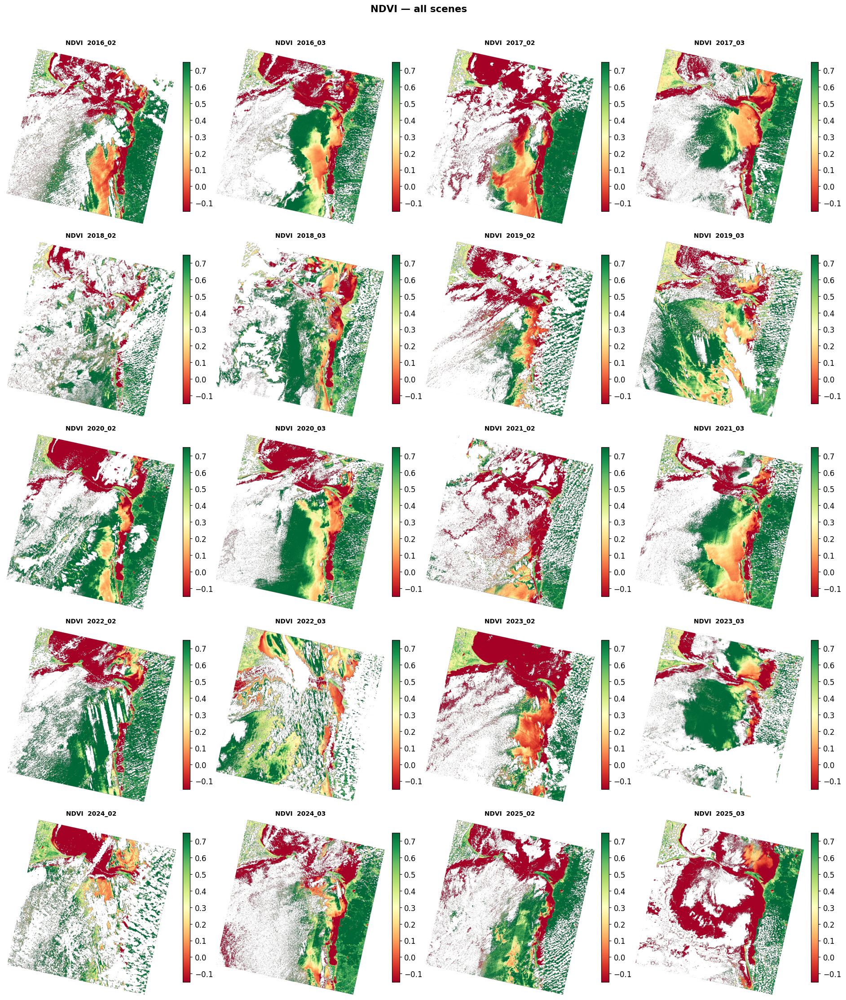

In [13]:
ncols = 4
nrows = (len(LABELS) + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4.3, nrows * 4.0))
axes = np.array(axes).ravel()

for i, label in enumerate(LABELS):
    ndvi_path = f"{OUT_DIR}/ndvi/{label}_ndvi.tif"
    if not os.path.exists(ndvi_path):
        axes[i].set_title(f"{label} — missing"); axes[i].axis("off"); continue

    with rasterio.open(ndvi_path) as src:
        arr = src.read(1).astype(np.float32)

    im = axes[i].imshow(arr, cmap="RdYlGn", vmin=-0.15, vmax=0.75)
    axes[i].set_title(f"NDVI  {label}", fontsize=9, fontweight="bold")
    axes[i].axis("off")
    plt.colorbar(im, ax=axes[i], fraction=0.046, pad=0.03, shrink=0.85)
    del arr; gc.collect()

for j in range(len(LABELS), len(axes)):
    axes[j].set_visible(False)

plt.suptitle("NDVI — all scenes", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/03_ndvi_grid.png", dpi=100, bbox_inches="tight")
plt.show()



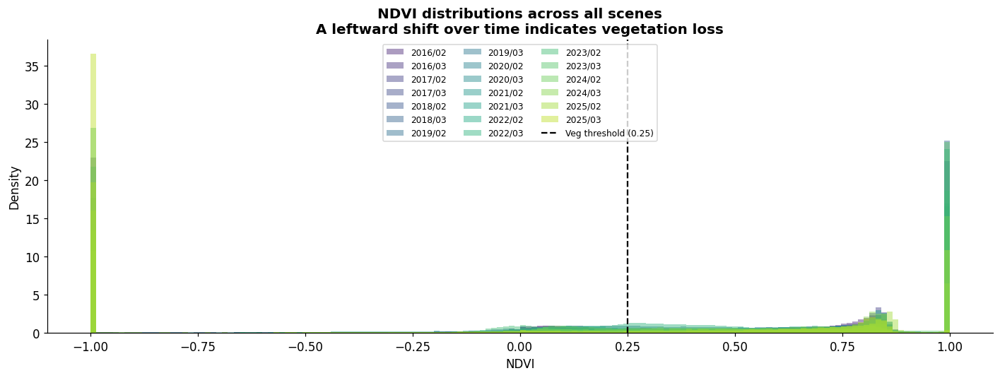

In [14]:
fig, ax = plt.subplots(figsize=(13, 5))
cmap_fn = matplotlib.colormaps.get_cmap("viridis")
palette  = [cmap_fn(x) for x in np.linspace(0.1, 0.9, len(LABELS))]

for i, label in enumerate(LABELS):
    ndvi_path = f"{OUT_DIR}/ndvi/{label}_ndvi.tif"
    if not os.path.exists(ndvi_path):
        continue
    with rasterio.open(ndvi_path) as src:
        arr = src.read(1).astype(np.float32)
    valid = arr[~np.isnan(arr)].ravel()
    del arr; gc.collect()
    if len(valid) > 300_000:
        rng   = np.random.default_rng(42)
        valid = rng.choice(valid, 300_000, replace=False)
    ax.hist(valid, bins=150, density=True, histtype="stepfilled",
            alpha=0.45, color=palette[i], edgecolor="none",
            label=label.replace("_", "/"))
    del valid

ax.axvline(VEG_THRESHOLD, color="black", ls="--", lw=1.5,
           label=f"Veg threshold ({VEG_THRESHOLD})")
ax.set_xlabel("NDVI")
ax.set_ylabel("Density")
ax.set_title("NDVI distributions across all scenes\n"
             "A leftward shift over time indicates vegetation loss",
             fontweight="bold")
ax.legend(ncol=3, fontsize=8)
plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/03_ndvi_hist.png", dpi=130, bbox_inches="tight")
plt.show()



### Model training — honest cross-scene accuracy

Trains using raw spectral bands only (B2–B7), **not** the derived indices. Labels are still generated from index thresholds (that is fine) but the model cannot 'see' the labelling rule because NDVI/NDWI/NDBI are absent from its feature set. Cross-scene validation on three independent dates gives a genuine generalisation accuracy.

In [15]:
# Pass 3 — Train BOTH standard (11 features) and honest (6 bands) models
#
# ROOT CAUSE OF THE PREVIOUS IndexError:
#   build_feature_matrix()  builds its own valid-pixel mask from all 11 features.
#   build_band_features()   builds a DIFFERENT mask from 6 bands only.
#   Because EVI / NBR can produce NaN where bands are valid, the two masks
#   select different pixel counts. Applying a mask from one to the other crashes.
#
# FIX: build X_bands by slicing band columns directly from vmask_std.
#   Both X_std and X_bands then cover the exact same set of pixels.
#   The build_band_features() function is not used here any more.

import time
import numpy as np
import rasterio
import joblib
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, cohen_kappa_score

FEAT_BANDS   = ["B2","B3","B4","B5","B6","B7"]
FEATURE_NAMES = ["B2","B3","B4","B5","B6","B7","NDVI","NDWI","NDBI","NBR","EVI"]

ref_label  = LABELS[0]
val_labels = [LABELS[i] for i in [4, 9, 14] if i < len(LABELS)]
print(f"Reference scene (Training): {ref_label}")
print(f"Validation scenes         : {val_labels}\n")

# ── Load reference scene ──────────────────────────────────────────────────────
with rasterio.open(f"{OUT_DIR}/stacked/{ref_label}_stack.tif") as src:
    ref_stk = src.read().astype(np.float32)

r_ndvi = read_index_tif(ref_label, "ndvi")
r_ndwi = read_index_tif(ref_label, "ndwi")
r_ndbi = read_index_tif(ref_label, "ndbi")
r_nbr  = read_index_tif(ref_label, "nbr")
r_evi  = read_index_tif(ref_label, "evi")

# 11-feature matrix + the valid mask it used
X_std, vmask_std = build_feature_matrix(ref_stk, r_ndvi, r_ndwi, r_ndbi, r_nbr, r_evi)

# ── FIX: extract band columns using the SAME vmask_std ────────────────────────
# Bands in the stack: idx 0=B1, 1=B2, 2=B3, 3=B4, 4=B5, 5=B6, 6=B7
# We want B2-B7 = indices 1-6.
# Reshape to (6, H*W), transpose to (H*W, 6), keep rows where vmask_std is True.
X_bands = (ref_stk[[1,2,3,4,5,6]]          # shape (6, H, W)
              .reshape(6, -1)               # shape (6, H*W)
              .T                            # shape (H*W, 6)
              [vmask_std.ravel()]           # keep same pixels as X_std
              .astype(np.float32))          # ← same row count as X_std guaranteed

print(f"X_std  shape : {X_std.shape}   (11 features, {vmask_std.sum():,} px)")
print(f"X_bands shape: {X_bands.shape}   (6 features,  same pixels)")

# Pseudo-labels from the vmask_std pixels
labs_all = pseudo_labels(r_ndvi[vmask_std], r_ndwi[vmask_std], r_ndbi[vmask_std])

del ref_stk, r_ndvi, r_ndwi, r_ndbi, r_nbr, r_evi
gc.collect()

# Keep only confidently labelled pixels
keep = labs_all >= 0
X_std_labelled   = X_std[keep]
X_bands_labelled = X_bands[keep]    # same length as X_std_labelled now
y_labelled       = labs_all[keep]

del X_std, X_bands, labs_all
gc.collect()

print(f"\nLabelled training pixels: {len(y_labelled):,}")
for cid, cname in CLASS_NAMES.items():
    n = int((y_labelled == cid).sum())
    print(f"  {cname:<22} {n:>9,}  ({100*n/len(y_labelled):.1f}%)")

# ── 1. Standard model (11 features) ──────────────────────────────────────────
SCALER   = StandardScaler()
X_std_sc = SCALER.fit_transform(X_std_labelled)
X_tr_std, X_te_std, y_tr_std, y_te_std = train_test_split(
    X_std_sc, y_labelled, test_size=0.25, stratify=y_labelled, random_state=42)
del X_std_sc; gc.collect()

print(f"\nTraining Standard RF ({len(X_tr_std):,} samples, 11 features) ...")
t0 = time.time()
RF = RandomForestClassifier(
    n_estimators=200, max_depth=15, min_samples_leaf=5,
    max_features="sqrt", class_weight="balanced",
    oob_score=True, n_jobs=-1, random_state=42)
RF.fit(X_tr_std, y_tr_std)
y_pred_te_std = RF.predict(X_te_std)
acc_std    = accuracy_score(y_te_std, y_pred_te_std)
kappa_std  = cohen_kappa_score(y_te_std, y_pred_te_std)
print(f"  Time  : {time.time()-t0:.1f}s")
print(f"  OOB   : {RF.oob_score_:.4f}")
print(f"  Acc   : {acc_std:.4f}  (in-scene holdout — inflated, circular labelling)")
print(f"  Kappa : {kappa_std:.4f}")
del X_tr_std, X_te_std; gc.collect()

# ── 2. Bands-only model (6 features) ─────────────────────────────────────────
SCALER_B   = StandardScaler()
X_bands_sc = SCALER_B.fit_transform(X_bands_labelled)
X_tr_b, X_te_b, y_tr_b, y_te_b = train_test_split(
    X_bands_sc, y_labelled, test_size=0.25, stratify=y_labelled, random_state=42)
del X_bands_sc, X_std_labelled, X_bands_labelled; gc.collect()

print(f"\nTraining Bands-Only RF ({len(X_tr_b):,} samples, 6 features) ...")
t0 = time.time()
RF_B = RandomForestClassifier(
    n_estimators=200, max_depth=15, min_samples_leaf=5,
    max_features="sqrt", class_weight="balanced",
    oob_score=True, n_jobs=-1, random_state=42)
RF_B.fit(X_tr_b, y_tr_b)
y_pred_te_b = RF_B.predict(X_te_b)
acc_b     = accuracy_score(y_te_b, y_pred_te_b)
kappa_b   = cohen_kappa_score(y_te_b, y_pred_te_b)
print(f"  Time  : {time.time()-t0:.1f}s")
print(f"  OOB   : {RF_B.oob_score_:.4f}")
print(f"  Acc   : {acc_b:.4f}  (in-scene holdout — meaningful, no circular dependency)")
print(f"  Kappa : {kappa_b:.4f}")
del X_tr_b, X_te_b; gc.collect()

# ── 3. Cross-scene validation ─────────────────────────────────────────────────
print(f"\n--- Cross-scene validation on {val_labels} ---")
std_accs, std_kappas, bands_accs, bands_kappas = [], [], [], []

for vl in val_labels:
    stk_p = f"{OUT_DIR}/stacked/{vl}_stack.tif"
    if not os.path.exists(stk_p):
        print(f"  {vl}: stacked TIF missing — skipping")
        continue

    with rasterio.open(stk_p) as src:
        vstk = src.read().astype(np.float32)

    v_ndvi = read_index_tif(vl, "ndvi")
    v_ndwi = read_index_tif(vl, "ndwi")
    v_ndbi = read_index_tif(vl, "ndbi")
    v_nbr  = read_index_tif(vl, "nbr")
    v_evi  = read_index_tif(vl, "evi")

    # 11-feature matrix + its valid mask
    X_v_std, vm_v_std = build_feature_matrix(vstk, v_ndvi, v_ndwi, v_ndbi, v_nbr, v_evi)

    # Bands-only using the SAME valid mask — same fix as training above
    X_v_bands = (vstk[[1,2,3,4,5,6]]
                    .reshape(6, -1).T
                    [vm_v_std.ravel()]
                    .astype(np.float32))

    labs_v = pseudo_labels(v_ndvi[vm_v_std], v_ndwi[vm_v_std], v_ndbi[vm_v_std])

    del vstk, v_ndvi, v_ndwi, v_ndbi, v_nbr, v_evi
    gc.collect()

    keep_v  = labs_v >= 0
    y_v_lab = labs_v[keep_v]

    # Standard model eval
    X_v_std_sc   = SCALER.transform(X_v_std[keep_v])
    y_v_pred_std = RF.predict(X_v_std_sc)
    acc_v_std    = accuracy_score(y_v_lab, y_v_pred_std)
    kappa_v_std  = cohen_kappa_score(y_v_lab, y_v_pred_std)
    std_accs.append(acc_v_std); std_kappas.append(kappa_v_std)
    del X_v_std, X_v_std_sc, y_v_pred_std; gc.collect()

    # Bands-only model eval
    X_v_bands_sc   = SCALER_B.transform(X_v_bands[keep_v])
    y_v_pred_bands = RF_B.predict(X_v_bands_sc)
    acc_v_bands    = accuracy_score(y_v_lab, y_v_pred_bands)
    kappa_v_bands  = cohen_kappa_score(y_v_lab, y_v_pred_bands)
    bands_accs.append(acc_v_bands); bands_kappas.append(kappa_v_bands)
    del X_v_bands, X_v_bands_sc, y_v_pred_bands, labs_v, y_v_lab; gc.collect()

    print(f"  {vl:<10} | Standard Acc={acc_v_std:.4f} Kappa={kappa_v_std:.4f} "
          f"| Bands-Only Acc={acc_v_bands:.4f} Kappa={kappa_v_bands:.4f}")

VAL_SCENE_LABELS  = val_labels
VAL_STD_ACCS      = std_accs
VAL_BANDS_ACCS    = bands_accs
VAL_STD_KAPPAS    = std_kappas
VAL_BANDS_KAPPAS  = bands_kappas

CROSS_SCENE_ACCURACY = float(np.mean(std_accs))   if std_accs   else 0.0
CROSS_SCENE_KAPPA    = float(np.mean(std_kappas))  if std_kappas else 0.0
CROSS_BAND_ACCURACY  = float(np.mean(bands_accs))  if bands_accs else 0.0
CROSS_BAND_KAPPA     = float(np.mean(bands_kappas)) if bands_kappas else 0.0

print(f"\n{'='*60}")
print(f"  CROSS-SCENE VALIDATION RESULTS")
print(f"{'='*60}")
print(f"  Standard model  (11 features) : Acc={CROSS_SCENE_ACCURACY:.4f}  Kappa={CROSS_SCENE_KAPPA:.4f}")
print(f"  Bands-only model (6 features) : Acc={CROSS_BAND_ACCURACY:.4f}  Kappa={CROSS_BAND_KAPPA:.4f}")
print()
grade = ("Excellent" if CROSS_BAND_KAPPA >= 0.80 else
          "Good"      if CROSS_BAND_KAPPA >= 0.60 else
          "Moderate"  if CROSS_BAND_KAPPA >= 0.40 else "Fair")
print(f"  Bands-only Kappa grade: {grade}")
print(f"  (This is the honest accuracy to report — model cannot see its own labels)")
print(f"{'='*60}")

joblib.dump(RF,       f"{OUT_DIR}/models/rf_model.pkl")
joblib.dump(SCALER,   f"{OUT_DIR}/models/scaler.pkl")
joblib.dump(RF_B,     f"{OUT_DIR}/models/rf_bands_only.pkl")
joblib.dump(SCALER_B, f"{OUT_DIR}/models/scaler_bands.pkl")
print("\nAll four models saved.")


Reference scene (Training): 2016_02
Validation scenes         : ['2018_02', '2020_03', '2023_02']

X_std  shape : (5212781, 11)   (11 features, 5,212,781 px)
X_bands shape: (5212781, 6)   (6 features,  same pixels)

Labelled training pixels: 3,799,010
  Water                  1,567,910  (41.3%)
  Vegetation             1,764,598  (46.4%)
  Bare Soil                 19,924  (0.5%)
  Built-Up                 446,578  (11.8%)

Training Standard RF (2,849,257 samples, 11 features) ...
  Time  : 112.2s
  OOB   : 1.0000
  Acc   : 1.0000  (in-scene holdout — inflated, circular labelling)
  Kappa : 1.0000

Training Bands-Only RF (2,849,257 samples, 6 features) ...
  Time  : 147.5s
  OOB   : 0.9810
  Acc   : 0.9810  (in-scene holdout — meaningful, no circular dependency)
  Kappa : 0.9686

--- Cross-scene validation on ['2018_02', '2020_03', '2023_02'] ---
  2018_02    | Standard Acc=1.0000 Kappa=1.0000 | Bands-Only Acc=0.9777 Kappa=0.9619
  2020_03    | Standard Acc=1.0000 Kappa=1.0000 | Bands-

  CLASSIFICATION ACCURACY REPORT (STANDARD 11-FEATURE MODEL)

--- In-scene metrics (same-scene 25% holdout) ---
  NOTE: These are inflated because pseudo-labels were generated
  from the same spectral indices used as model features.

              precision    recall  f1-score   support

       Water       1.00      1.00      1.00    391978
  Vegetation       1.00      1.00      1.00    441150
   Bare Soil       1.00      1.00      1.00      4981
    Built-Up       1.00      1.00      1.00    111644

    accuracy                           1.00    949753
   macro avg       1.00      1.00      1.00    949753
weighted avg       1.00      1.00      1.00    949753

  Overall accuracy  : 1.0000
  Cohen Kappa       : 1.0000

--- Cross-scene metrics (model evaluated on unseen dates) ---
  These are the honest, meaningful numbers to use in your report.
  Mean Standard Accuracy : 1.0000 (Kappa: 1.0000)
  Mean Bands-Only Accuracy: 0.9753 (Kappa: 0.9552)


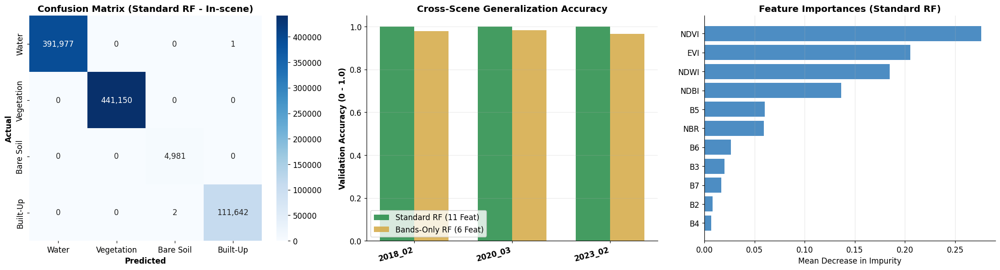

In [16]:
# --- CELL 18 ---
print("=" * 60)
print("  CLASSIFICATION ACCURACY REPORT (STANDARD 11-FEATURE MODEL)")
print("=" * 60)

print("\n--- In-scene metrics (same-scene 25% holdout) ---")
print("  NOTE: These are inflated because pseudo-labels were generated")
print("  from the same spectral indices used as model features.")
print()
print(classification_report(y_te_std, y_pred_te_std,
      target_names=[CLASS_NAMES[i] for i in range(4)]))

print(f"  Overall accuracy  : {accuracy_score(y_te_std, y_pred_te_std):.4f}")
print(f"  Cohen Kappa       : {cohen_kappa_score(y_te_std, y_pred_te_std):.4f}")

print()
print("--- Cross-scene metrics (model evaluated on unseen dates) ---")
print("  These are the honest, meaningful numbers to use in your report.")
print(f"  Mean Standard Accuracy : {CROSS_SCENE_ACCURACY:.4f} (Kappa: {CROSS_SCENE_KAPPA:.4f})")
print(f"  Mean Bands-Only Accuracy: {CROSS_BAND_ACCURACY:.4f} (Kappa: {CROSS_BAND_KAPPA:.4f})")

fig, axes = plt.subplots(1, 3, figsize=(20, 5.5))

# 1. Confusion Matrix
cm = confusion_matrix(y_te_std, y_pred_te_std)
sns.heatmap(cm, annot=True, fmt=",d", cmap="Blues",
            xticklabels=[CLASS_NAMES[i] for i in range(4)],
            yticklabels=[CLASS_NAMES[i] for i in range(4)], ax=axes[0])
axes[0].set_xlabel("Predicted", fontweight="bold")
axes[0].set_ylabel("Actual",    fontweight="bold")
axes[0].set_title("Confusion Matrix (Standard RF - In-scene)", fontweight="bold")

# 2. Scene-by-Scene Validation Accuracy Comparison (Grouped Bar Chart)
if 'VAL_SCENE_LABELS' in globals() and len(VAL_SCENE_LABELS) > 0:
    x = np.arange(len(VAL_SCENE_LABELS))
    width = 0.35
    axes[1].bar(x - width/2, VAL_STD_ACCS, width, label="Standard RF (11 Feat)", color="#238b45", alpha=0.85)
    axes[1].bar(x + width/2, VAL_BANDS_ACCS, width, label="Bands-Only RF (6 Feat)", color="#d4a843", alpha=0.85)
    axes[1].set_ylabel("Validation Accuracy (0 - 1.0)", fontweight="bold")
    axes[1].set_title("Cross-Scene Generalization Accuracy", fontweight="bold")
    axes[1].set_xticks(x)
    axes[1].set_xticklabels(VAL_SCENE_LABELS, rotation=15, ha="right", fontweight="bold")
    axes[1].set_ylim(0.0, 1.05)
    axes[1].legend(loc="lower left")
    axes[1].grid(axis="y", alpha=0.25)
else:
    # Fallback to mean bar chart if lists not available
    models = ["Standard (11 Feat)", "Bands-Only (6 Feat)"]
    accs   = [CROSS_SCENE_ACCURACY, CROSS_BAND_ACCURACY]
    kappas = [CROSS_SCENE_KAPPA, CROSS_BAND_KAPPA]
    x = np.arange(len(models))
    width = 0.35
    axes[1].bar(x - width/2, accs, width, label="Mean Accuracy", color="#238b45", alpha=0.85)
    axes[1].bar(x + width/2, kappas, width, label="Mean Cohen Kappa", color="#d4a843", alpha=0.85)
    axes[1].set_ylabel("Metric Score (0 - 1.0)", fontweight="bold")
    axes[1].set_title("Cross-Scene Validation Comparison", fontweight="bold")
    axes[1].set_xticks(x)
    axes[1].set_xticklabels(models, fontweight="bold")
    axes[1].set_ylim(0.0, 1.05)
    axes[1].legend(loc="lower left")
    axes[1].grid(axis="y", alpha=0.25)

# 3. Feature Importances
fi    = RF.feature_importances_
order = np.argsort(fi)
axes[2].barh(np.array(FEATURE_NAMES)[order], fi[order].astype(float),
             color="#2171b5", alpha=0.8)
axes[2].set_xlabel("Mean Decrease in Impurity")
axes[2].set_title("Feature Importances (Standard RF)", fontweight="bold")
axes[2].grid(axis="x", alpha=0.3)

plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/04_rf_evaluation.png", dpi=130, bbox_inches="tight")
plt.show()

In [17]:
# Pass 4 — classify every scene, apply LAND_MASK.
# This ensures area stats reflect just the land portion, excluding open water.

if "RF" not in globals():
    RF     = joblib.load(f"{OUT_DIR}/models/rf_model.pkl")
    SCALER = joblib.load(f"{OUT_DIR}/models/scaler.pkl")
    print("Model loaded from disk.")

print("Pass 4 — Classifying all scenes (land pixels only) ...\n")
area_records = []

# Define colormap for GeoTIFF embedding (Forest=Green, Bare Soil=Yellow, Built-up=Red, Water=Blue)
raster_colormap = {
    0: (35, 139, 69, 255),    # Forest -> Green (RGBA)
    1: (212, 168, 67, 255),   # Bare Soil -> Yellow (RGBA)
    2: (203, 24, 29, 255),    # Built-Up -> Red (RGBA)
    3: (33, 113, 181, 255)    # Water -> Blue (RGBA)
}

for label in LABELS:
    stk_path  = f"{OUT_DIR}/stacked/{label}_stack.tif"
    cmap_path = f"{OUT_DIR}/classmaps/{label}_classmap.tif"

    if not os.path.exists(stk_path):
        print(f"  {label}: stacked TIF missing"); continue

    t0 = time.time()
    with rasterio.open(stk_path) as src:
        stk     = src.read().astype(np.float32)
        profile = src.profile.copy()

    H, W = stk.shape[1], stk.shape[2]
    # Reuse indices from disk if possible to save memory
    ndvi = read_index_tif(label, "ndvi")
    ndwi = read_index_tif(label, "ndwi")
    ndbi = read_index_tif(label, "ndbi")
    nbr  = read_index_tif(label, "nbr")
    evi  = read_index_tif(label, "evi")

    X_all, vmask = build_feature_matrix(stk, ndvi, ndwi, ndbi, nbr, evi)
    del stk, ndvi, ndwi, ndbi, nbr, evi; gc.collect()

    X_sc = SCALER.transform(X_all)
    del X_all; gc.collect()

    preds = RF.predict(X_sc).astype(np.int8)
    del X_sc; gc.collect()

    # Reconstruct 2D map
    cmap = np.full((H, W), -1, dtype=np.int8)
    cmap[vmask] = preds
    del preds; gc.collect()

    # Apply Land Mask
    lm = LAND_MASK[:H, :W]
    cmap[~lm] = -1  # Mask out ocean
    del vmask; gc.collect()

    # Save classmap with embedded colormap
    p = profile.copy()
    p.update(count=1, dtype="int8", compress="lzw", nodata=-1)
    with rasterio.open(cmap_path, "w", **p) as dst:
        dst.write(cmap[np.newaxis, :, :])
        # Embed colormap in the TIF file natively
        dst.write_colormap(1, raster_colormap)

    # Record areas
    counts = np.bincount(cmap[cmap >= 0].ravel(), minlength=4)
    record = {"label": label}
    for cid, cname in CLASS_NAMES.items():
        record[cname] = counts[cid] * PX_HA
    area_records.append(record)

    del cmap; gc.collect()
    print(f"  {label}  done  ({time.time()-t0:.0f}s)")

df_area = pd.DataFrame(area_records)
print("\nPass 4 complete.")

Pass 4 — Classifying all scenes (land pixels only) ...

  2016_02  done  (24s)
  2016_03  done  (16s)
  2017_02  done  (15s)
  2017_03  done  (14s)
  2018_02  done  (9s)
  2018_03  done  (12s)
  2019_02  done  (10s)
  2019_03  done  (15s)
  2020_02  done  (14s)
  2020_03  done  (14s)
  2021_02  done  (10s)
  2021_03  done  (13s)
  2022_02  done  (14s)
  2022_03  done  (12s)
  2023_02  done  (13s)
  2023_03  done  (11s)
  2024_02  done  (11s)
  2024_03  done  (13s)
  2025_02  done  (13s)
  2025_03  done  (12s)

Pass 4 complete.


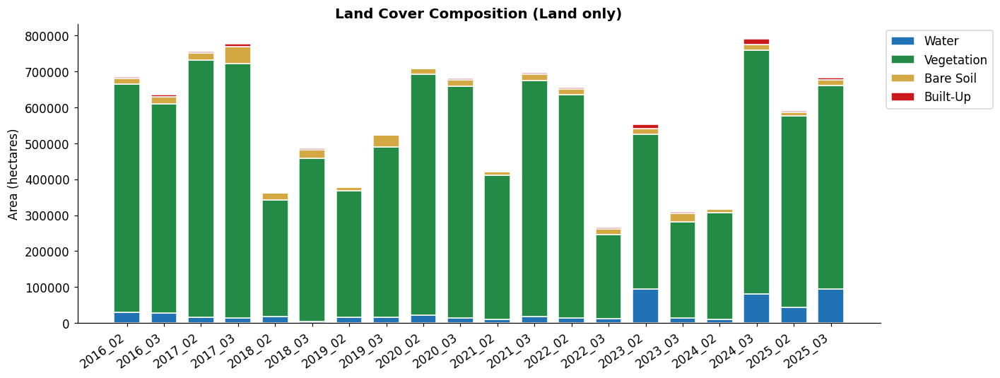

In [18]:
fig, ax = plt.subplots(figsize=(13, 5))
bottom = np.zeros(len(df_area))
for cid in range(4):
    cname = CLASS_NAMES[cid]
    color = CLASS_COLORS[cid]
    vals  = df_area[cname].values
    ax.bar(df_area["label"], vals, bottom=bottom, color=color, label=cname, edgecolor="white", width=0.7)
    bottom += vals

ax.set_ylabel("Area (hectares)")
ax.set_title("Land Cover Composition (Land only)", fontweight="bold")
ax.legend(loc="upper left", bbox_to_anchor=(1, 1))
plt.xticks(rotation=35, ha="right")
plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/04_area_trends.png", dpi=130, bbox_inches="tight")
plt.show()



Reading baseline classmap : 2016_02 ...
Reading final classmap    : 2025_03 ...


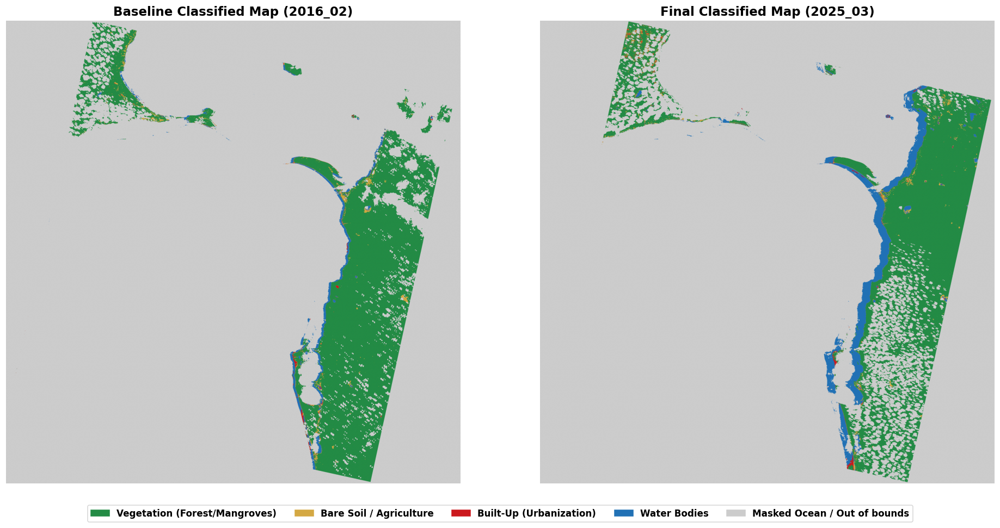

Before-and-after spatial classification map successfully plotted and saved.


In [20]:
# ── Before vs. After Spatial Land Cover Mapping ──────────────────────────────────
# This reads the first (baseline) and last (final) classified GeoTIFF maps,
# shifts the values to align with a custom colormap, and displays them side-by-side.

import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap

first_label = LABELS[0]
last_label  = LABELS[-1]

print(f"Reading baseline classmap : {first_label} ...")
with rasterio.open(f"{OUT_DIR}/classmaps/{first_label}_classmap.tif") as src:
    cm_first = src.read(1).astype(np.int8)

print(f"Reading final classmap    : {last_label} ...")
with rasterio.open(f"{OUT_DIR}/classmaps/{last_label}_classmap.tif") as src:
    cm_last = src.read(1).astype(np.int8)

# Map values to align with ListedColormap
# Original values: -1 (masked), 0 (water), 1 (veg), 2 (soil), 3 (urban)
# Shifted by +1 to make them positive: 0, 1, 2, 3, 4
cm_first_shifted = cm_first.copy() + 1
cm_last_shifted  = cm_last.copy() + 1

# Define colormap matching CLASS_COLORS
# Values: -1 (grey), 0 (blue), 1 (green), 2 (yellow), 3 (red)
colors = [CLASS_COLORS[-1], CLASS_COLORS[0], CLASS_COLORS[1], CLASS_COLORS[2], CLASS_COLORS[3]]
cmap_custom = ListedColormap(colors)

fig, axes = plt.subplots(1, 2, figsize=(18, 9))

# Plot baseline
im1 = axes[0].imshow(cm_first_shifted, cmap=cmap_custom, vmin=0, vmax=4)
axes[0].set_title(f"Baseline Classified Map ({first_label})", fontweight="bold", fontsize=15)
axes[0].axis("off")

# Plot final
im2 = axes[1].imshow(cm_last_shifted, cmap=cmap_custom, vmin=0, vmax=4)
axes[1].set_title(f"Final Classified Map ({last_label})", fontweight="bold", fontsize=15)
axes[1].axis("off")

# Build professional horizontal legend
patches = [
    mpatches.Patch(color=CLASS_COLORS[1], label="Vegetation (Forest/Mangroves)"),
    mpatches.Patch(color=CLASS_COLORS[2], label="Bare Soil / Agriculture"),
    mpatches.Patch(color=CLASS_COLORS[3], label="Built-Up (Urbanization)"),
    mpatches.Patch(color=CLASS_COLORS[0], label="Water Bodies"),
    mpatches.Patch(color=CLASS_COLORS[-1], label="Masked Ocean / Out of bounds")
]
fig.legend(handles=patches, loc="lower center", ncol=5, fontsize=12, prop={"weight": "bold"}, bbox_to_anchor=(0.5, 0.04))

plt.tight_layout()
fig.subplots_adjust(bottom=0.12) # Leave space for the legend at the bottom

# Save as high-res PNG for report
plt.savefig(f"{OUT_DIR}/graphs/05_before_after_maps.png", dpi=150, bbox_inches="tight")
plt.show()

print("Before-and-after spatial classification map successfully plotted and saved.")

In [21]:
# Pass 5 — Change Detection (Seasonal-Adjusted)
# Matches same calendar month for T1/T2 to avoid phenology bias.

sorted_labels = df_ts["label"].tolist()
T2 = sorted_labels[-1]
target_month = T2.split("_")[1]
T1 = sorted_labels[0] # Default
for label in sorted_labels:
    if label.split("_")[1] == target_month and label != T2:
        T1 = label
        break

print(f"Seasonal-adjusted change detection: {T1} to {T2}")

with rasterio.open(f"{OUT_DIR}/ndvi/{T1}_ndvi.tif") as src:
    ndvi_t1 = src.read(1).astype(np.float32)
    ref_prof = src.profile.copy()
with rasterio.open(f"{OUT_DIR}/ndvi/{T2}_ndvi.tif") as src:
    ndvi_t2 = src.read(1).astype(np.float32)

h = min(ndvi_t1.shape[0], ndvi_t2.shape[0])
w = min(ndvi_t1.shape[1], ndvi_t2.shape[1])
km = KALP_MASK[:h, :w]

diff = (ndvi_t2[:h, :w] - ndvi_t1[:h, :w]).astype(np.float32)
diff[~km] = np.nan # Mask ocean

chg = np.zeros_like(diff, dtype=np.int8)
chg[diff < -0.08] = -1 # Loss
chg[diff >  0.08] =  1 # Gain
chg[np.isnan(diff)] = -99 # No data

vstats = veg_change_stats(ndvi_t1, ndvi_t2, land_mask=KALP_MASK)

print("="*52)
print(f"  Vegetation change  {T1}  to  {T2}")
print("="*52)
print(f"  Veg area at {T1}  : {vstats['n_veg_t1']:>10,} px  ({vstats['n_veg_t1'] * PX_HA:>10,.0f} ha)")
print(f"  Veg area at {T2}  : {vstats['n_veg_t2']:>10,} px  ({vstats['n_veg_t2'] * PX_HA:>10,.0f} ha)")
print(f"  Area lost          : {vstats['lost_px']:>10,} px  ({vstats['lost_ha']:>8,.1f} ha)  {vstats['pct_loss']:+.2f}%")
print(f"  Area gained        : {vstats['gained_px']:>10,} px  ({vstats['gained_ha']:>8,.1f} ha)  {vstats['pct_gain']:+.2f}%")
print(f"  Net change         : {vstats['net_ha']:>10,.1f} ha  ({vstats['pct_net']:+.2f}%)")



Seasonal-adjusted change detection: 2016_03 to 2025_03
  Vegetation change  2016_03  to  2025_03
  Veg area at 2016_03  :     97,474 px  (    35,091 ha)
  Veg area at 2025_03  :     42,352 px  (    15,247 ha)
  Area lost          :     56,795 px  (20,446.2 ha)  +58.27%
  Area gained        :      1,673 px  (   602.3 ha)  +1.72%
  Net change         :  -19,843.9 ha  (-56.55%)


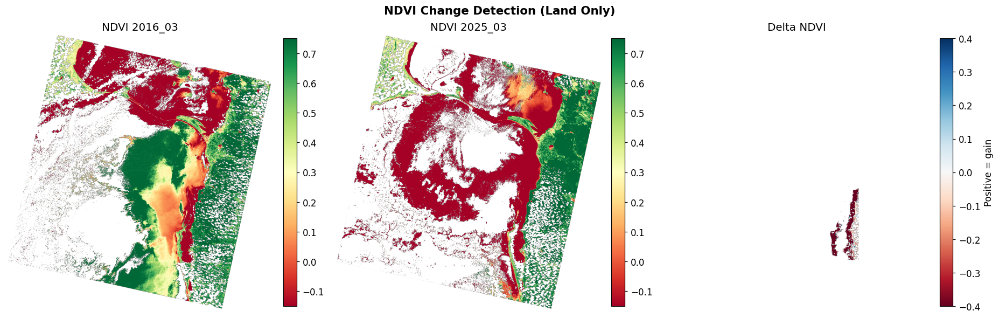

In [22]:
fig, axes = plt.subplots(1, 3, figsize=(17, 5.5))
im0 = axes[0].imshow(ndvi_t1, cmap="RdYlGn", vmin=-0.15, vmax=0.75)
axes[0].set_title(f"NDVI {T1}"); axes[0].axis("off")
plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.03)

im1 = axes[1].imshow(ndvi_t2, cmap="RdYlGn", vmin=-0.15, vmax=0.75)
axes[1].set_title(f"NDVI {T2}"); axes[1].axis("off")
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.03)

im2 = axes[2].imshow(diff, cmap="RdBu", vmin=-0.4, vmax=0.4)
axes[2].set_title("Delta NDVI"); axes[2].axis("off")
cb2 = plt.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.03)
cb2.set_label("Positive = gain")

plt.suptitle("NDVI Change Detection (Land Only)", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.savefig(f"{OUT_DIR}/change/ndvi_change_maps.png", dpi=110, bbox_inches="tight")
plt.show()



Transition matrix (2016_03 to 2025_03) pixels:
To (2025_03)    Water  Vegetation  Bare Soil  Built-Up
From (2016_03)                                        
Water           20708        1019        183       372
Vegetation      53134       40334       2098      1235
Bare Soil        2964         422        108        99
Built-Up         5008         285         22        25


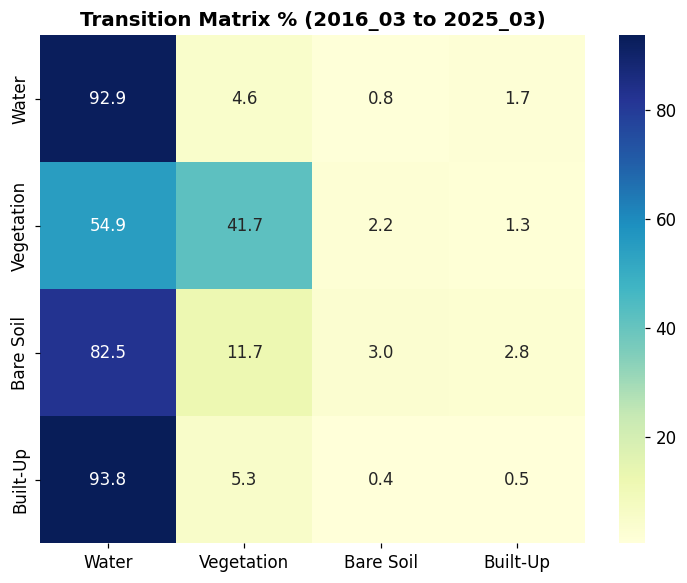

In [23]:
# Transition matrix using vectorised np.bincount (much faster)
def get_cm(label):
    with rasterio.open(f"{OUT_DIR}/classmaps/{label}_classmap.tif") as src:
        return src.read(1).astype(np.int8)

cm1 = get_cm(T1); cm2 = get_cm(T2)
h_ = min(cm1.shape[0], cm2.shape[0])
w_ = min(cm1.shape[1], cm2.shape[1])
f1 = cm1[:h_, :w_].ravel(); f2 = cm2[:h_, :w_].ravel()
valid = (f1 >= 0) & (f2 >= 0)

# Filter to Kalpitiya ROI — removes the rest of the tile
if 'KALP_MASK' in dir() and KALP_MASK is not None:
    lm_flat = KALP_MASK[:h_, :w_].ravel()
    valid = valid & lm_flat

combined = f1[valid].astype(np.int64) * 4 + f2[valid].astype(np.int64)
counts = np.bincount(combined, minlength=16)
mat = counts.reshape(4, 4)

cls_labels = [CLASS_NAMES[i] for i in range(4)]
df_tm = pd.DataFrame(mat, index=cls_labels, columns=cls_labels)
df_tm.index.name = f"From ({T1})"; df_tm.columns.name = f"To ({T2})"
print(f"Transition matrix ({T1} to {T2}) pixels:")
print(df_tm.to_string())
df_tm.to_csv(f"{OUT_DIR}/stats/transition_matrix.csv")

# Normalised matrix (percentages)
row_sums = mat.sum(axis=1, keepdims=True)
mat_norm = np.where(row_sums > 0, 100.0 * mat / row_sums, 0.0)
df_tmn = pd.DataFrame(mat_norm, index=cls_labels, columns=cls_labels)
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(df_tmn, annot=True, fmt=".1f", cmap="YlGnBu", ax=ax)
ax.set_title(f"Transition Matrix % ({T1} to {T2})", fontweight="bold")
plt.savefig(f"{OUT_DIR}/graphs/05_transition_matrix.png", dpi=110)
plt.show()



In [24]:
# Sequential pair change detection — land pixels only
pair_rows = []; diff_stack = []
for i in range(len(sorted_labels) - 1):
    l1, l2 = sorted_labels[i], sorted_labels[i+1]
    p1 = f"{OUT_DIR}/ndvi/{l1}_ndvi.tif"; p2 = f"{OUT_DIR}/ndvi/{l2}_ndvi.tif"
    if not (os.path.exists(p1) and os.path.exists(p2)): continue
    with rasterio.open(p1) as src: n1 = src.read(1).astype(np.float32)
    with rasterio.open(p2) as src: n2 = src.read(1).astype(np.float32)
    h_ = min(n1.shape[0], n2.shape[0]); w_ = min(n1.shape[1], n2.shape[1])
    d = (n2[:h_, :w_] - n1[:h_, :w_]).astype(np.float32)
    lm_ = LAND_MASK[:h_, :w_]; d[~lm_] = np.nan
    diff_stack.append(d.copy())
    vs = veg_change_stats(n1, n2, land_mask=(KALP_MASK if ('KALP_MASK' in dir() and KALP_MASK is not None) else LAND_MASK))
    pair_rows.append({"from": l1, "to": l2, "mean_delta": round(float(np.nanmean(d)), 5), **vs})
    print(f"  {l1} to {l2}  lost={vs['lost_ha']:.0f}ha  gained={vs['gained_ha']:.0f}ha")
    del n1, n2, d; gc.collect()
df_pairs = pd.DataFrame(pair_rows)
df_pairs.to_csv(f"{OUT_DIR}/stats/sequential_changes.csv", index=False)



  2016_02 to 2016_03  lost=228ha  gained=137ha
  2016_03 to 2017_02  lost=1953ha  gained=8294ha
  2017_02 to 2017_03  lost=1336ha  gained=3101ha
  2017_03 to 2018_02  lost=1637ha  gained=1672ha
  2018_02 to 2018_03  lost=1852ha  gained=2492ha
  2018_03 to 2019_02  lost=1734ha  gained=1731ha
  2019_02 to 2019_03  lost=17ha  gained=5ha
  2019_03 to 2020_02  lost=187ha  gained=341ha
  2020_02 to 2020_03  lost=4306ha  gained=3087ha
  2020_03 to 2021_02  lost=1214ha  gained=2397ha
  2021_02 to 2021_03  lost=1667ha  gained=989ha
  2021_03 to 2022_02  lost=1529ha  gained=1910ha
  2022_02 to 2022_03  lost=5240ha  gained=1047ha
  2022_03 to 2023_02  lost=11727ha  gained=685ha
  2023_02 to 2023_03  lost=58ha  gained=764ha
  2023_03 to 2024_02  lost=26ha  gained=12ha
  2024_02 to 2024_03  lost=2652ha  gained=266ha
  2024_03 to 2025_02  lost=1736ha  gained=13007ha
  2025_02 to 2025_03  lost=11558ha  gained=530ha


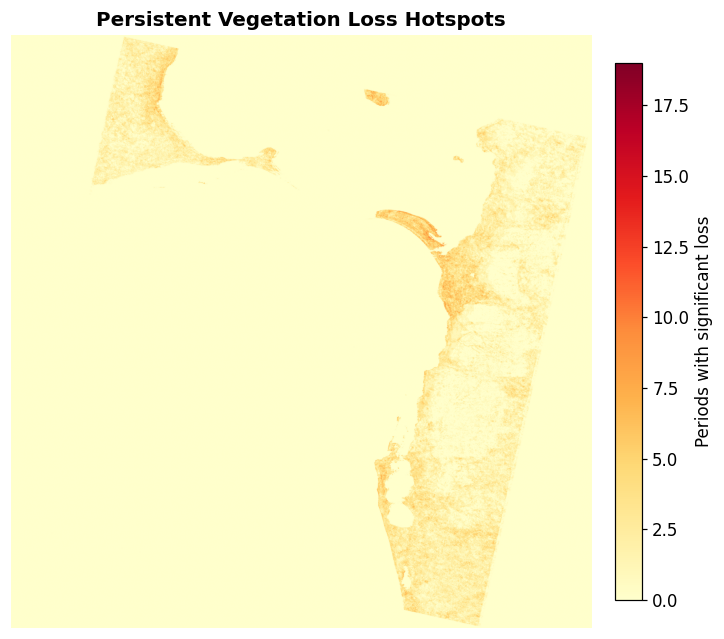

In [25]:
# Hotspot map: count consecutive periods of significant loss.
if diff_stack:
    ref = diff_stack[0]
    hotspot = np.zeros(ref.shape, dtype=np.uint8)
    for d in diff_stack:
        h_ = min(ref.shape[0], d.shape[0]); w_ = min(ref.shape[1], d.shape[1])
        hotspot[:h_, :w_] += (d[:h_, :w_] < -0.08).astype(np.uint8)
    del diff_stack, ref; gc.collect()
    n_periods = len(pair_rows)
    fig, ax = plt.subplots(figsize=(9, 7))
    im = ax.imshow(hotspot, cmap="YlOrRd", vmin=0, vmax=max(1, n_periods))
    ax.set_title("Persistent Vegetation Loss Hotspots", fontweight="bold")
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.035, pad=0.03, label="Periods with significant loss")
    plt.savefig(f"{OUT_DIR}/change/loss_hotspots.png", dpi=120)
    plt.show()



In [26]:
# Pass 6 — Trend Analysis & Forecast
# Rebuilds df_ts using only land pixels and filters for reliable scenes.

print("Rebuilding time-series from land pixels only ...\n")
ts_land = []
for label in LABELS:
    ndvi_path = f"{OUT_DIR}/ndvi/{label}_ndvi.tif"
    if not os.path.exists(ndvi_path): continue
    with rasterio.open(ndvi_path) as src:
        arr = src.read(1).astype(np.float32)
    h = min(arr.shape[0], LAND_MASK.shape[0]); w = min(arr.shape[1], LAND_MASK.shape[1])
    land_ndvi = arr[:h, :w].copy(); land_ndvi[~LAND_MASK[:h, :w]] = np.nan
    valid = land_ndvi[~np.isnan(land_ndvi)].ravel()
    meta = SCENES[label].get("_meta", {})
    date = meta.get("date")
    if len(valid) > 1000 and date:
        # Land cloud fraction (if available)
        cloud_path = f"{OUT_DIR}/stacked/{label}_cloud.txt"
        cloud_pct = 0.0
        if os.path.exists(cloud_path):
            with open(cloud_path, 'r') as f: cloud_pct = float(f.read())
        
        ts_land.append({
            "label": label, "date": date,
            "date_frac": date.year + (date.timetuple().tm_yday - 1) / 365.0,
            "mean_ndvi": float(np.nanmean(land_ndvi)),
            "std_ndvi": float(np.nanstd(land_ndvi)),
            "reliable": cloud_pct < 50.0,
            "pct_dense": 100.0 * (land_ndvi > 0.50).sum() / len(valid)
        })
    del arr; gc.collect()

df_ts_land = pd.DataFrame(ts_land).sort_values("date").reset_index(drop=True)
df_reliable = df_ts_land[df_ts_land["reliable"]].copy()

if len(df_reliable) < 3:
    print("WARNING: Few reliable scenes. Using all scenes for trend.")
    df_reliable = df_ts_land.copy()

X = df_reliable["date_frac"].values.reshape(-1, 1)
y = df_reliable["mean_ndvi"].values
lr = LinearRegression().fit(X, y)
poly = make_pipeline(PolynomialFeatures(2), LinearRegression()).fit(X, y)
gbr = GradientBoostingRegressor(n_estimators=100, random_state=42).fit(X, y)

slope, intercept, r_val, p_val, _ = scipy_stats.linregress(X.ravel(), y)
print(f"Linear Slope: {slope:+.6f} NDVI/yr (R2={r_val**2:.4f}, p={p_val:.4f})")

# Forecast to 2030
f_dates = np.arange(df_ts_land["date_frac"].max() + 0.25, 2031.0, 0.25)
X_f = f_dates.reshape(-1, 1)
ens = (lr.predict(X_f) + poly.predict(X_f) + gbr.predict(X_f)) / 3.0

# --- Compute 95% Confidence Intervals for Linear Trend ---
n = len(X.ravel())
mean_x = np.mean(X.ravel())
ss_x = np.sum((X.ravel() - mean_x) ** 2)

# Predictions on historical data to find residuals
y_pred_hist = lr.predict(X)
residuals = y - y_pred_hist
s_e = np.sqrt(np.sum(residuals ** 2) / (n - 2))

# Critical t-value for 95% confidence
t_crit = scipy_stats.t.ppf(0.975, df=n-2)

# Compute fit standard error and confidence interval for the forecast dates
se_fit = s_e * np.sqrt(1/n + ((f_dates - mean_x) ** 2) / ss_x)
ci_margin = t_crit * se_fit

# Linear forecast values
lr_f = lr.predict(X_f)
lr_lower = lr_f - ci_margin
lr_upper = lr_f + ci_margin

df_fore = pd.DataFrame({
    "date_frac": f_dates, 
    "ensemble": ens,
    "linear": lr_f,
    "linear_lower": lr_lower,
    "linear_upper": lr_upper
})

print("Forecast dataset with 95% confidence intervals built.")

# ── Print key numbers for the report ─────────────────────────────────────────
print()
print("=" * 58)
print("  TREND & FORECAST SUMMARY  (use these in your report)")
print("=" * 58)
print(f"  Trend slope       : {slope:+.6f} NDVI / year")
print(f"  R squared         : {r_val**2:.4f}")
print(f"  p-value           : {p_val:.4f}  ", end="")
if p_val < 0.05:
    print("(statistically significant at 5%)")
elif p_val < 0.10:
    print("(approaching significance — marginally outside 5%)")
else:
    print("(not significant at 5%)")
print(f"  Direction         : {'DECLINING' if slope < 0 else 'INCREASING'}")
print(f"  Reliable scenes   : {len(df_reliable)} of {len(df_ts_land)}")
print()
print(f"  Ensemble NDVI 2030     : {ens[-1]:.4f}")
print(f"  Linear forecast 2030   : {lr_f[-1]:.4f}")
print(f"  95% CI lower (2030)    : {lr_lower[-1]:.4f}")
print(f"  95% CI upper (2030)    : {lr_upper[-1]:.4f}")
print(f"  CI width at 2030       : {(lr_upper[-1] - lr_lower[-1]):.4f}")
print("=" * 58)

Rebuilding time-series from land pixels only ...

Linear Slope: -0.011118 NDVI/yr (R2=0.2605, p=0.0519)
Forecast dataset with 95% confidence intervals built.

  TREND & FORECAST SUMMARY  (use these in your report)
  Trend slope       : -0.011118 NDVI / year
  R squared         : 0.2605
  p-value           : 0.0519  (approaching significance — marginally outside 5%)
  Direction         : DECLINING
  Reliable scenes   : 15 of 20

  Ensemble NDVI 2030     : 0.4559
  Linear forecast 2030   : 0.4805
  95% CI lower (2030)    : 0.3564
  95% CI upper (2030)    : 0.6046
  CI width at 2030       : 0.2482


C:\Users\isula\AppData\Local\Temp\ipykernel_16508\2973341152.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


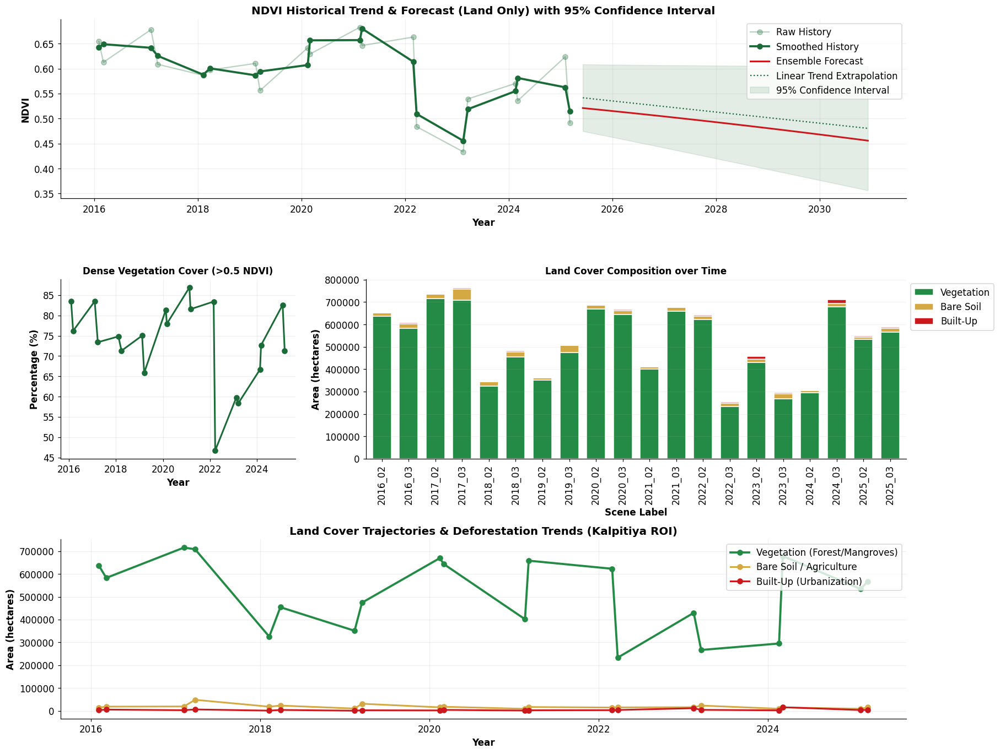

In [27]:
# Summary Dashboard
fig = plt.figure(figsize=(18, 15))  # Increased height to fit 3 rows comfortably
gs = gridspec.GridSpec(3, 3, figure=fig, hspace=0.45, wspace=0.3)

# 1. NDVI Trend (Row 0, full width)
ax1 = fig.add_subplot(gs[0, :])
x_obs = df_ts_land["date_frac"].values; y_obs = df_ts_land["mean_ndvi"].values
ax1.plot(x_obs, y_obs, "o-", color="#1a6b38", alpha=0.3, label="Raw History")
if len(y_obs) >= 5:
    y_smooth = savgol_filter(y_obs, 5, 2)
    ax1.plot(x_obs, y_smooth, "o-", color="#1a6b38", lw=2.5, label="Smoothed History")

ax1.plot(df_fore["date_frac"], df_fore["ensemble"], "-", color="#cb181d", lw=2.0, label="Ensemble Forecast")
ax1.plot(df_fore["date_frac"], df_fore["linear"], ":", color="#1a6b38", lw=1.5, label="Linear Trend Extrapolation")
ax1.fill_between(df_fore["date_frac"], df_fore["linear_lower"], df_fore["linear_upper"], color="#1a6b38", alpha=0.12, label="95% Confidence Interval")

ax1.set_xlabel("Year", fontweight="bold")
ax1.set_ylabel("NDVI", fontweight="bold")
ax1.set_title("NDVI Historical Trend & Forecast (Land Only) with 95% Confidence Interval", fontweight="bold", fontsize=13)
ax1.legend(loc="upper right")
ax1.grid(alpha=0.2)

# 2. Vegetation Categories (Row 1, left)
ax2 = fig.add_subplot(gs[1, 0])
ax2.plot(df_ts_land["date_frac"], df_ts_land["pct_dense"], "o-", color="#1a6b38", lw=2.0)
ax2.set_xlabel("Year", fontweight="bold")
ax2.set_ylabel("Percentage (%)", fontweight="bold")
ax2.set_title("Dense Vegetation Cover (>0.5 NDVI)", fontweight="bold", fontsize=11)
ax2.grid(alpha=0.2)

# 3. Areas (Row 1, middle & right)
ax3 = fig.add_subplot(gs[1, 1:])
df_area.set_index("label")[["Vegetation", "Bare Soil", "Built-Up"]].plot(kind="bar", stacked=True, ax=ax3, color=["#238b45", "#d4a843", "#cb181d"], edgecolor="white", width=0.7)
ax3.set_ylabel("Area (hectares)", fontweight="bold")
ax3.set_xlabel("Scene Label", fontweight="bold")
ax3.set_title("Land Cover Composition over Time", fontweight="bold", fontsize=11)
ax3.legend(loc="upper left", bbox_to_anchor=(1, 1))
ax3.grid(alpha=0.15, axis="y")

# 4. Hectares Trajectories Over Time (Row 2, full width)
ax4 = fig.add_subplot(gs[2, :])
df_area_ts = pd.merge(df_area, df_ts_land[["label", "date_frac"]], on="label").sort_values("date_frac")
ax4.plot(df_area_ts["date_frac"], df_area_ts["Vegetation"], "o-", color="#238b45", lw=2.5, label="Vegetation (Forest/Mangroves)")
ax4.plot(df_area_ts["date_frac"], df_area_ts["Bare Soil"], "o-", color="#d4a843", lw=2.0, label="Bare Soil / Agriculture")
ax4.plot(df_area_ts["date_frac"], df_area_ts["Built-Up"], "o-", color="#cb181d", lw=2.0, label="Built-Up (Urbanization)")

ax4.set_xlabel("Year", fontweight="bold")
ax4.set_ylabel("Area (hectares)", fontweight="bold")
ax4.set_title("Land Cover Trajectories & Deforestation Trends (Kalpitiya ROI)", fontweight="bold", fontsize=13)
ax4.legend(loc="upper right")
ax4.grid(alpha=0.2)

plt.tight_layout()
plt.savefig(f"{OUT_DIR}/graphs/06_summary_dashboard.png", dpi=130, bbox_inches="tight")
plt.show()

In [28]:
print("Generated files:")
for root, dirs, files in os.walk(OUT_DIR):
    for f in sorted(files):
        p = os.path.join(root, f)
        print(f"  [{os.path.getsize(p)/1024:>7.1f} KB]  {os.path.relpath(p)}")



Generated files:
  [  175.3 KB]  out\change\loss_hotspots.png
  [  790.1 KB]  out\change\ndvi_change_maps.png
  [  220.7 KB]  out\classmaps\2016_02_classmap.tif
  [  267.4 KB]  out\classmaps\2016_03_classmap.tif
  [  216.4 KB]  out\classmaps\2017_02_classmap.tif
  [  245.2 KB]  out\classmaps\2017_03_classmap.tif
  [  248.4 KB]  out\classmaps\2018_02_classmap.tif
  [  245.2 KB]  out\classmaps\2018_03_classmap.tif
  [  240.3 KB]  out\classmaps\2019_02_classmap.tif
  [  253.7 KB]  out\classmaps\2019_03_classmap.tif
  [  235.0 KB]  out\classmaps\2020_02_classmap.tif
  [  252.3 KB]  out\classmaps\2020_03_classmap.tif
  [  243.7 KB]  out\classmaps\2021_02_classmap.tif
  [  244.6 KB]  out\classmaps\2021_03_classmap.tif
  [  270.2 KB]  out\classmaps\2022_02_classmap.tif
  [  217.9 KB]  out\classmaps\2022_03_classmap.tif
  [  267.4 KB]  out\classmaps\2023_02_classmap.tif
  [  233.4 KB]  out\classmaps\2023_03_classmap.tif
  [  219.2 KB]  out\classmaps\2024_02_classmap.tif
  [  231.3 KB]  out\cla